# Comparison of Image Compression Techniques
- JPEG (1992 original standard) - DCT and quantization vs. thresholding
- JPEG2000 - only look at lossy standard. DWT -> quantization -> run length encoding (not spec)
- JPEGThreshold - variant w/ thresholding
- SVD (not good)
- DWT->SVD->QUANT->IDWT (not good)
- SVD->DWT->QUANT->IDWT (same as if DWT and SVD are switched)

In [1]:
using Plots
using LaTeXStrings
using LinearAlgebra
using FFTW
using Images
using TestImages
using Wavelets
using Colors

In [11]:
function threshold2D!(x, compressionRatio)
    dimensions = size(x)
    (compressionRatio > 1) && (compressionRatio = 1)
    num_threshold = round(Int, length(x)*compressionRatio)
    ind = sortperm(vec(x), alg=QuickSort, by=abs)
    for i = 1:length(x) - num_threshold
        zero_idx = ind[i]
        row = rem(zero_idx-1, size(x)[1])+1
        col = div(zero_idx-1, size(x)[1])+1
        x[row, col] = 0
    end
end;

# helper functions to convert between 512x512 matrix of RGB{Float}
# and 512x512x3 matrix of Float (representing YCbCr)
# these representations are easier to work with in implementation
function RGB2YpCbCr(rgbImg)
    yCbCrImg = convert.(YCbCr, rgbImg)
    rawYpCbCr = zeros(size(yCbCrImg, 1), size(yCbCrImg, 2), 3)
    rawYpCbCr[:,:,1] = getproperty.(yCbCrImg, :y)
    rawYpCbCr[:,:,2] = getproperty.(yCbCrImg, :cb)
    rawYpCbCr[:,:,3] = getproperty.(yCbCrImg, :cr)
    return rawYpCbCr
end


function YpCbCr2RGB(yCbCrImg)
    return convert.(RGB, YCbCr.(yCbCrImg[:,:,1], yCbCrImg[:,:,2], yCbCrImg[:,:,3]))
end

function evaluateMSE(rgbImg, compRgbImg)
    ypcbcrOrig = RGB2YpCbCr(rgbImg)
    ypcbcrComp = RGB2YpCbCr(compRgbImg)
    delta = rgbImg .- compRgbImg
    rgbMSE = 1/(3*length(rgbImg)).*sum((red.(delta)).^2 .+ (green.(delta)).^2 .+ (blue.(delta)).^2)
    yMSE = 1/length(rgbImg).*sum((ypcbcrOrig[:,:,1] - ypcbcrComp[:,:,1]).^2)./(255^2)
    cdiffMSE = 1/(length(rgbImg)).*sum(colordiff.(img, compImg).^2)./(255^2)
    println("RGB-MSE: ", rgbMSE);
    println("Y-MSE: ", yMSE);
    println("dE2000: ", cdiffMSE)
    println("RGB-PSNR: ", -10*log10(rgbMSE));
    println("Y-PSNR: ", -10*log10(yMSE));
    println("dE2000-PSNR: ", -10*log10(cdiffMSE));
    return rgbMSE, yMSE, cdiffMSE
end

evaluateMSE (generic function with 1 method)

# JPEG Image Compression With DCT (Standard Quantization and Hard Thresholding)

In [3]:
function makeQuantizationTable(qualityFactor)
    # base (Q = 50) quantization table
    Tb = [
        16    11    10    16    24    40    51    61;
        12    12    14    19    26    58    60    55;
        14    13    16    24    40    57    69    56;
        14    17    22    29    51    87    80    62;
        18    22    37    56    68   109   103    77;
        24    35    55    64    81   104   113    92;
        49    64    78    87   103   121   120   101;
        72    92    95    98   112   100   103    99
    ]
    if (qualityFactor < 50)
        S = 5000/qualityFactor
    else
        S = 200 - 2*qualityFactor
    end
    Ts = floor.((Tb.*S .+ 50) ./ 100)
    Ts[Ts .== 0] .= 1;
    return Ts
end

function zigzagIndices(k, tileSize)
    if k >= div(tileSize * (tileSize + 1), 2)
        i, j = zigzagIndices(tileSize * tileSize - k - 1, tileSize)
        return tileSize - i - 1, tileSize - j - 1
    end
    i = floor(Int,div((sqrt(1 + 8 * k) - 1), 2))
    j = k - div(i *(i + 1), 2)
    if mod(i, 2) != 0
        return j, i - j
    else
        return i - j, j
    end
end

function jpegQuantCompress(rgbImg, qualityFactor)
    nnzQuant = 0
    nnzOrig = 0
    bits = 0
    quant = makeQuantizationTable.(qualityFactor)
    YpCbCr = RGB2YpCbCr(rgbImg)
    tileSize = 8 # forced to 8 because of quantization table size
    # make zigzag matrix
    zigzag = zeros(Int, tileSize, tileSize)
    for k=0:tileSize*tileSize-1
        i, j = zigzagIndices(k, tileSize)
        zigzag[i + 1, j + 1] = k+1
    end
    flatDct = zeros(tileSize*tileSize)
    flatQuant = zeros(tileSize*tileSize, 3)
    for channel = 1:3
        for idct=1:tileSize
            for jdct=1:tileSize
                flatQuant[zigzag[idct, jdct], channel] = quant[channel][idct, jdct];
            end
        end
    end
    # will chop off excess image if image side-length isn't a multiple of tileSize
    for i = 1:div(size(YpCbCr, 1),tileSize)
        for j = 1:div(size(YpCbCr, 2),tileSize)
            for channel in 1:3
                slice = view(YpCbCr, (i-1)*tileSize+1:i*tileSize, (j-1)*tileSize+1:j*tileSize, channel)
                FFTW.dct!(slice);
                nnzOrig += count(i->(i!=0), slice)
                slice[:,:] = sign.(slice).*floor.(abs.(slice)./quant[channel]);
                nnzQuant += count(i->(i!=0), slice)
                # unroll DCT and calculate number of bits required to store run length encoding
                for idct=1:tileSize
                    for jdct=1:tileSize
                        flatDct[zigzag[idct, jdct]] = slice[idct, jdct];
                    end
                end
                finalZero = false
                for idct=1:tileSize*tileSize
                    finalZero = true
                    if flatDct[idct] != 0
                        finalZero = false
                        bits += ceil(log2(tileSize*tileSize-1)) + ceil(log2(round(255/flatQuant[idct, channel])))
                    end
                end
                if finalZero
                    # if final element in tile is zero, then we need to include it anyway
                    bits += ceil(log2(tileSize*tileSize-1))
                end
                slice[:,:] = quant[channel].*slice
                FFTW.idct!(slice)
                YpCbCr[(i-1)*tileSize+1:i*tileSize, (j-1)*tileSize+1:j*tileSize, channel] = slice;
            end
        end
    end
    RGB = YpCbCr2RGB(YpCbCr)
    return RGB, bits, nnzQuant, nnzOrig
end

function jpegThreshCompress(rgbImg, tileSize, compRatio)
    nnzThresh = 0
    nnzOrig = 0
    bits = 0
    YpCbCr = RGB2YpCbCr(rgbImg)
    zigzag = zeros(Int, tileSize, tileSize)
    for k=0:tileSize*tileSize-1
        i, j = zigzagIndices(k, tileSize)
        zigzag[i + 1, j + 1] = k+1
    end
    flatDct = zeros(tileSize*tileSize)
    # will chop off excess image if image side-length isn't a multiple of tileSize
    for i = 1:div(size(rgbImg, 1),tileSize)
        for j = 1:div(size(rgbImg, 2),tileSize)
            for channel = 1:3
                slice = view(YpCbCr, (i-1)*tileSize+1:i*tileSize, (j-1)*tileSize+1:j*tileSize, channel)
                FFTW.dct!(slice);
                nnzOrig += count(i->(i!=0), slice)
                threshold2D!(slice, compRatio[channel]);
                nnzThresh += count(i->(i!=0), slice)
                # unroll DCT and calculate number of bits required to store run length encoding
                for idct=1:tileSize
                    for jdct=1:tileSize
                        flatDct[zigzag[idct, jdct]] = slice[idct, jdct];
                    end
                end
                for idct=1:tileSize*tileSize
                    if flatDct[idct] != 0
                        bits += ceil(log2(tileSize*tileSize-1)) + ceil(log2(256))
                    end
                end
                FFTW.idct!(slice);
                YpCbCr[(i-1)*tileSize+1:i*tileSize, (j-1)*tileSize+1:j*tileSize, channel] = slice;
            end
        end
    end
    RGB = YpCbCr2RGB(YpCbCr)
    return RGB, bits, nnzThresh, nnzOrig
end

jpegThreshCompress (generic function with 1 method)

Original Image


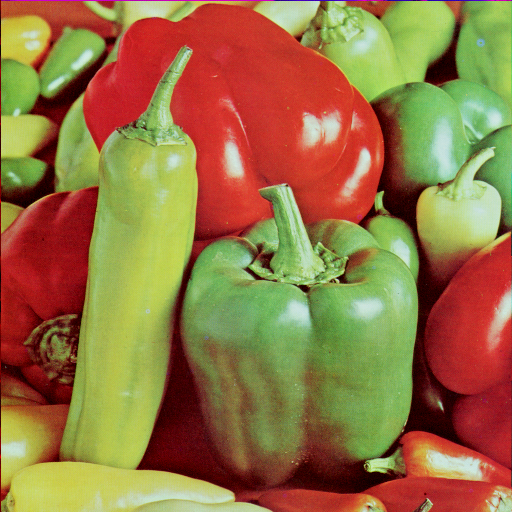


JPEG Quantization:


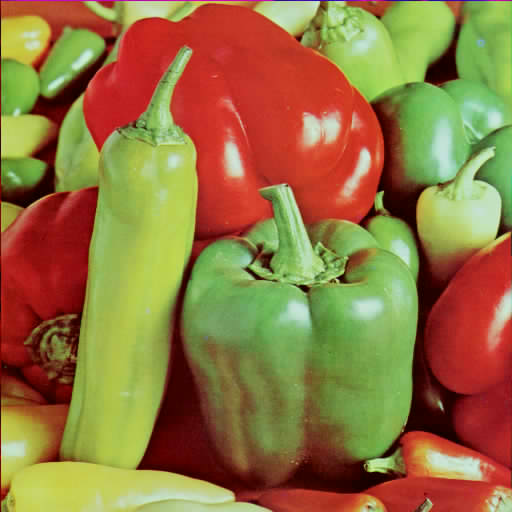

compression ratio: 0.08661905924479167 (12:1), nnz ratio = 0.05401611328125
RGB-MSE: 0.0008153812148479923
Y-MSE: 0.00025204879169749304
dE2000: 0.00020773974555721958
RGB-PSNR: 30.8863929825771
Y-PSNR: 35.98515380195158
dE2000-PSNR: 36.82480404645311

Tiled DCT Hard Thresholding:


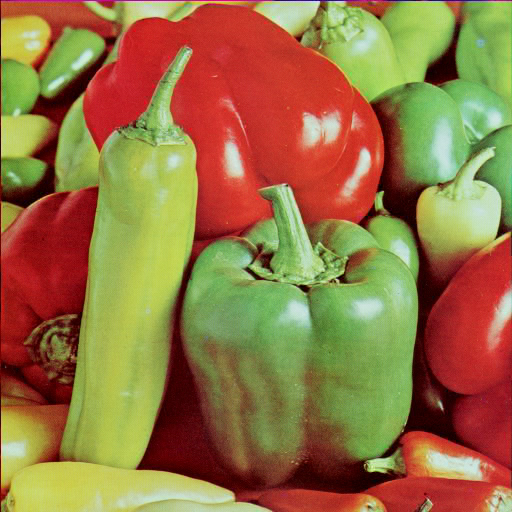

compression ratio: 0.22786458333333334 (4:1), nnz ratio = 0.13020833333333334
RGB-MSE: 0.0007834749621205058
Y-MSE: 8.817090414858183e-5
dE2000: 0.00023265111237333308
RGB-PSNR: 31.05974877927555
Y-PSNR: 40.546747057119035
dE2000-PSNR: 36.332948666362135


(0.0007834749621205058, 8.817090414858183e-5, 0.00023265111237333308)

In [12]:
#img = testimage("airplaneF16")
#img = testimage("mandrill")
img = testimage("peppers")
println("Original Image");
display(img)

# standard JPEG (1992)
println("\nJPEG Quantization:");
compImg, bits, nnzC, nnzO = jpegQuantCompress(img, [75 40 40])
display(compImg)
cr = bits / (24*length(compImg))
println("compression ratio: ", cr, " (", round(Int,1/cr), ":1), nnz ratio = ", nnzC/nnzO)
rgbMSE, yMSE, cdiffMSE = evaluateMSE(img, compImg)

# hard thresholding of entire image DCT
println("\nTiled DCT Hard Thresholding:");
compImg, bits, nnzC, nnzO = jpegThreshCompress(img, 8, [0.3 0.05 0.05])
display(compImg)
cr = bits / (24*length(compImg))
println("compression ratio: ", cr, " (", round(Int,1/cr), ":1), nnz ratio = ", nnzC/nnzO)
rgbMSE, yMSE, cdiffMSE = evaluateMSE(img, compImg)

# JPEG2000 Compression With Discrete Wavelet Transform

In [5]:
function countRLEBits(imgArray, subbandQuantization, numSubbandLevels, tileSize)
    bits = 0
    if imgArray[1, 1] != 0
        bits += 8
    end
    for i=1:numSubbandLevels
        wlo = 2^(i-1)+1
        whi = 2^i
        dataBits = ceil(log2(256/subbandQuantization[i]))
        if wlo - 1 > tileSize
            runBits = ceil(log2(tileSize*tileSize))
            bitsPerNonZero = runBits + dataBits
            numTiles = div(wlo-1, tileSize)
            for subband = 1:3
                if subband == 1
                    xOffset = 1
                    yOffset = wlo
                elseif subband == 2
                    xOffset = wlo
                    yOffset = wlo
                else
                    xOffset = wlo
                    yOffset = 1
                end
                finalZero = false
                for i = 1:numTiles
                    for j = 1:numTiles
                        for iTile = 0:tileSize-1
                            for jTile = 0:tileSize-1
                                x = (i-1)*tileSize + iTile + xOffset
                                y = (j-1)*tileSize + jTile + yOffset
                                finalZero = true
                                if imgArray[x, y] != 0
                                    finalZero = false
                                    bits += bitsPerNonZero
                                end
                            end
                        end
                        if finalZero
                            # don't need bits for data because decoder can sum previous RLE lengths
                            # in this tile with this last piece of data and determine that the final
                            # value was zero
                            bits += runBits
                        end
                    end
                end
            end
        else
            runBits = ceil(log2((wlo-1)*(wlo-1)))
            bitsPerNonZero = runBits + dataBits
            finalZero = false
            for i = 1:whi
                for j = 1:whi
                    if i < wlo && j < wlo
                        # only count bits for current subband
                        continue
                    end
                    finalZero = true
                    if imgArray[i, j] != 0
                        finalZero = false
                        bits += bitsPerNonZero
                    end
                end
            end
            if finalZero
                bits += runBits
            end
        end
    end
    return bits
end

function waveletThresholdCompress(rgbImg, wt, compRatio, rleTileSize)
    YpCbCr = RGB2YpCbCr(rgbImg)
    dwtHOrig = zeros(3)
    dwtHThresh = zeros(3)
    nnzOrig = 0
    nnzThresh = 0
    bits = 0
    for c = 1:3
        channel = YpCbCr[:,:,c]
        dwt!(channel, wt)
        dwtHOrig[c] = entropy(log2, channel)
        nnzOrig += count(i->(i!=0), channel)
        threshold2D!(channel, compRatio[c])
        dwtHThresh[c] = entropy(log2, channel)
        nnzThresh += count(i->(i!=0), channel)
        # zigzag traverse subbands of wavelet tree to do run length encoding
        # for each subband, just traverse 2D array normally (row-major/col-major order)
        # get number of subband levels (e.g. 9 for 512x512 image)
        numSubbandLevels = maxtransformlevels(channel)
        bits += countRLEBits(channel, ones(numSubbandLevels), numSubbandLevels, rleTileSize)
        idwt!(channel, wt)
        YpCbCr[:,:,c] = channel
    end
    RGB = YpCbCr2RGB(YpCbCr)
    return RGB, bits, nnzThresh, nnzOrig, dwtHThresh, dwtHOrig
end

function waveletQuantizedCompress(rgbImg, wt, quantTable, rleTileSize)
    YpCbCr = RGB2YpCbCr(rgbImg)
    dwtHOrig = zeros(3)
    dwtHQuant = zeros(3)
    nnzOrig = 0
    nnzQuant = 0
    bits = 0
    for c = 1:3
        channel = YpCbCr[:,:,c]
        dwt!(channel, wt)
        dwtHOrig[c] = entropy(log2, channel)
        nnzOrig += count(i->(i!=0), channel)
        # create wavelet transform quantization table
        # Do subband scalar quantization (https://www2.seas.gwu.edu/~ayoussef/papers/FingerPrintWSQ-chapter.pdf)
        # get number of subband levels (e.g. 9 for 512x512 image)
        numSubbandLevels = maxtransformlevels(channel)
        # do strong quantization of highest subband levels
        # don't quantize DC subband
        for i=1:numSubbandLevels
            wlo = 2^(i-1)+1
            whi = 2^i
            subband = view(channel, wlo:whi, 1:whi)
            channel[wlo:whi, 1:whi] = sign.(subband) .* quantTable[c, i] .* floor.(abs.(subband) ./ quantTable[c, i]);
            subband = view(channel, 1:wlo-1, wlo:whi)
            channel[1:wlo-1, wlo:whi] = sign.(subband) .* quantTable[c, i] .* floor.(abs.(subband) ./ quantTable[c, i]);
        end
        dwtHQuant[c] = entropy(log2, channel)
        nnzQuant += count(i->(i!=0), channel)
        bits += countRLEBits(channel, quantTable, numSubbandLevels, rleTileSize)
        idwt!(channel, wt)
        YpCbCr[:,:,c] = channel
    end
    RGB = YpCbCr2RGB(YpCbCr)
    return RGB, bits, nnzQuant, nnzOrig, dwtHQuant, dwtHOrig
end

function waveletTiledQuantizedCompress(rgbImg, wt, quantTable, tileSize)
    bits = 0
    nnzQuant = 0
    nnzOrig = 0
    dwtHOrig = zeros(3)
    dwtHQuant = zeros(3)
    compImg = RGB.(zeros(size(rgbImg, 1), size(rgbImg, 2)))
    for i = 1:div(size(rgbImg, 1),tileSize)
        for j = 1:div(size(rgbImg, 2),tileSize)
            slice = rgbImg[(i-1)*tileSize+1:i*tileSize, (j-1)*tileSize+1:j*tileSize]
            sliceComp, b, nQ, nO, HQ, HO = waveletQuantizedCompress(slice, wt, quantTable, tileSize)
            compImg[(i-1)*tileSize+1:i*tileSize, (j-1)*tileSize+1:j*tileSize] = sliceComp
            bits += b
            nnzQuant += nQ
            nnzOrig += nO
            dwtHQuant .+= HQ
            dwtHOrig .+= HO
        end
    end
    dwtHQuant ./= length(rgbImg)/(tileSize*tileSize)
    dwtHOrig ./= length(rgbImg)/(tileSize*tileSize)
    return compImg, bits, nnzQuant, nnzOrig, dwtHQuant, dwtHOrig
end

waveletTiledQuantizedCompress (generic function with 1 method)

Original Image


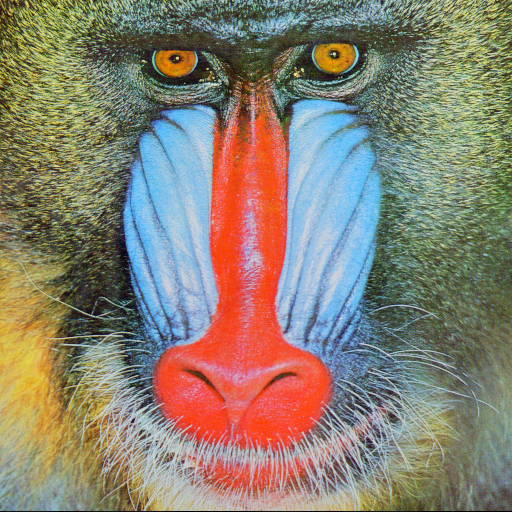

Wavelet Thresholding


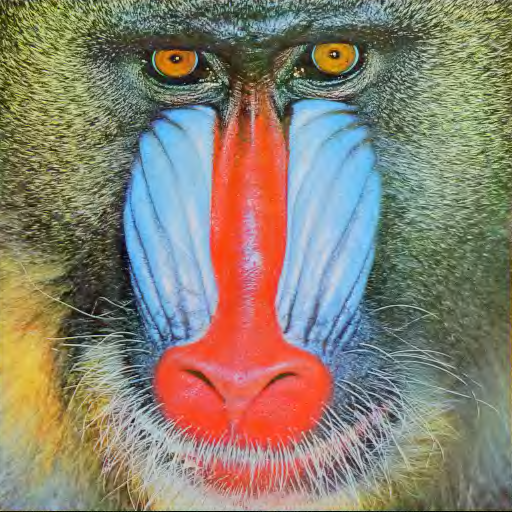

compression ratio: 0.19446754455566406 (5:1), nnz ratio = 0.07000096638997395
Original DWT entropy (YCbCr) = [0.29402052750108965, 0.015052235721656482, 0.018023202391280965]
Compressed DWT entropy (YCbCr) = [0.29402052750108965, 0.015052235721656482, 0.018023202391280965]
RGB-MSE: 0.0029405951829787093
Y-MSE: 0.0007522936799081278
dE2000: 0.0011646751850903018
RGB-PSNR: 25.315647585257082
Y-PSNR: 31.236125867153795
dE2000-PSNR: 29.337951776352718

Wavelet Thresholding with Tiled RLE


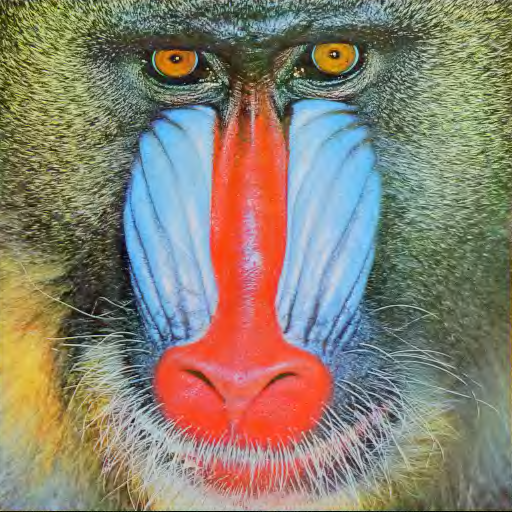

compression ratio: 0.13319969177246094 (8:1), nnz ratio = 0.07000096638997395
Original DWT entropy (YCbCr) = [0.29402052750108965, 0.015052235721656482, 0.018023202391280965]
Compressed DWT entropy (YCbCr) = [0.29402052750108965, 0.015052235721656482, 0.018023202391280965]
RGB-MSE: 0.0029405951829787093
Y-MSE: 0.0007522936799081278
dE2000: 0.0011646751850903018
RGB-PSNR: 25.315647585257082
Y-PSNR: 31.236125867153795
dE2000-PSNR: 29.337951776352718

Wavelet Quantization


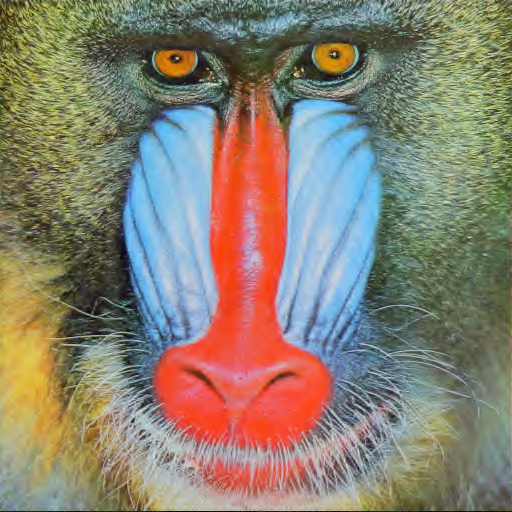

compression ratio: 0.1730038324991862 (6:1), nnz ratio = 0.0648816426595052
Original DWT entropy (YCbCr) = [0.29402052750108965, 0.015052235721656482, 0.018023202391280965]
Compressed DWT entropy (YCbCr) = [0.18122592375923469, 0.014795580184490141, 0.01759342818896712]
RGB-MSE: 0.003283085111851481
Y-MSE: 0.0015085674036975647
dE2000: 0.001087623212987852
RGB-PSNR: 24.837178583220428
Y-PSNR: 28.214352805172105
dE2000-PSNR: 29.635215319001404

Wavelet Quantization with tiled RLE


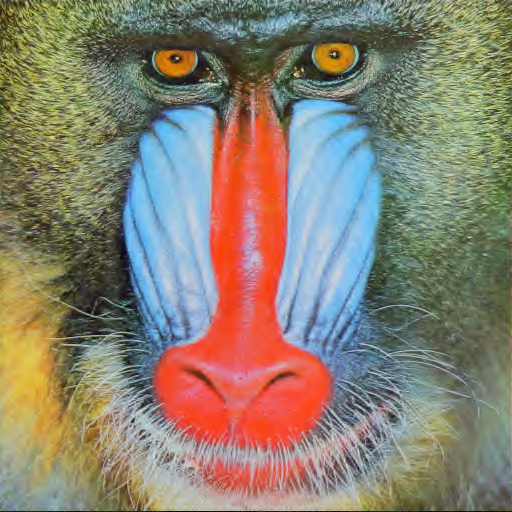

compression ratio: 0.12429364522298177 (8:1), nnz ratio = 0.0648816426595052
Original DWT entropy (YCbCr) = [0.29402052750108965, 0.015052235721656482, 0.018023202391280965]
Compressed DWT entropy (YCbCr) = [0.18122592375923469, 0.014795580184490141, 0.01759342818896712]
RGB-MSE: 0.003283085111851481
Y-MSE: 0.0015085674036975647
dE2000: 0.001087623212987852
RGB-PSNR: 24.837178583220428
Y-PSNR: 28.214352805172105
dE2000-PSNR: 29.635215319001404

Tiled Wavelet Quantization


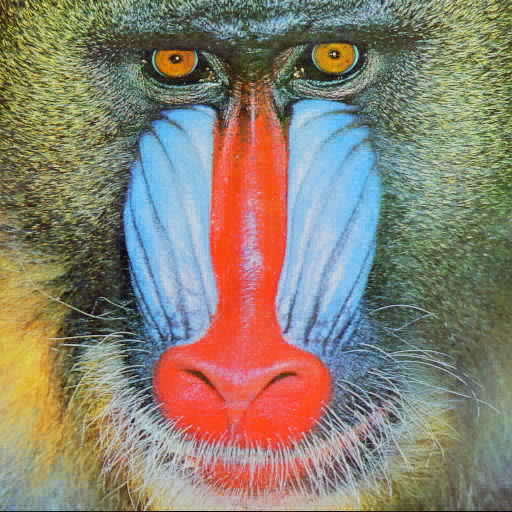

compression ratio: 0.21660216649373373 (5:1), nnz ratio = 0.1757024129231771
Original DWT entropy (YCbCr) = [3.581252480106097, 2.797587266584865, 2.594177772499982]
Compressed DWT entropy (YCbCr) = [1.8595236285368488, 0.6320832365723313, 0.5490373064076506]
RGB-MSE: 0.0019360419742054835
Y-MSE: 0.0006663992700793376
dE2000: 0.0007731880270042625
RGB-PSNR: 27.130852312382583
Y-PSNR: 31.762654872925793
dE2000-PSNR: 31.117148797420885


(0.0019360419742054835, 0.0006663992700793376, 0.0007731880270042625)

In [13]:
img = testimage("mandrill")
println("Original Image");
display(img)
wt = wavelet(WT.cdf97, WT.Lifting)

# wavelet threshold compression
println("Wavelet Thresholding")
compImg, bits, nnzC, nnzO, dwtHComp, dwtHOrig = waveletThresholdCompress(img, wt, [0.2 0.005 0.005], 512)
display(compImg)
cr = bits / (24*length(compImg))
println("compression ratio: ", cr, " (", round(Int,1/cr), ":1), nnz ratio = ", nnzC/nnzO)
println("Original DWT entropy (YCbCr) = ", dwtHOrig)
println("Compressed DWT entropy (YCbCr) = ", dwtHComp)
rgbMSE, yMSE, cdiffMSE = evaluateMSE(img, compImg)

# wavelet threshold compression with tiled RLE
println("\nWavelet Thresholding with Tiled RLE")
compImg, bits, nnzC, nnzO, dwtHComp, dwtHOrig = waveletThresholdCompress(img, wt, [0.2 0.005 0.005], 8)
display(compImg)
cr = bits / (24*length(compImg))
println("compression ratio: ", cr, " (", round(Int,1/cr), ":1), nnz ratio = ", nnzC/nnzO)
println("Original DWT entropy (YCbCr) = ", dwtHOrig)
println("Compressed DWT entropy (YCbCr) = ", dwtHComp)
rgbMSE, yMSE, cdiffMSE = evaluateMSE(img, compImg)

# wavelet quantization
println("\nWavelet Quantization")
quantTable = [1 1 1 1 1 7 22 24 26; 1 1 1 1 1 7 22 24 26; 1 1 1 1 1 7 22 24 26]
compImg, bits, nnzC, nnzO, dwtHComp, dwtHOrig = waveletQuantizedCompress(img, wt, quantTable, 512)
display(compImg)
cr = bits / (24*length(compImg))
println("compression ratio: ", cr, " (", round(Int,1/cr), ":1), nnz ratio = ", nnzC/nnzO)
println("Original DWT entropy (YCbCr) = ", dwtHOrig)
println("Compressed DWT entropy (YCbCr) = ", dwtHComp)
rgbMSE, yMSE, cdiffMSE = evaluateMSE(img, compImg)

# wavelet quantization with tiled RLE
println("\nWavelet Quantization with tiled RLE")
quantTable = [1 1 1 1 1 7 22 24 26; 1 1 1 1 1 7 22 24 26; 1 1 1 1 1 7 22 24 26]
compImg, bits, nnzC, nnzO, dwtHComp, dwtHOrig = waveletQuantizedCompress(img, wt, quantTable, 8)
display(compImg)
cr = bits / (24*length(compImg))
println("compression ratio: ", cr, " (", round(Int,1/cr), ":1), nnz ratio = ", nnzC/nnzO)
println("Original DWT entropy (YCbCr) = ", dwtHOrig)
println("Compressed DWT entropy (YCbCr) = ", dwtHComp)
rgbMSE, yMSE, cdiffMSE = evaluateMSE(img, compImg)


# tiled wavelet quantization
println("\nTiled Wavelet Quantization")
quantTable = [1 8 16; 2 16 16; 2 16 16]
compImg, bits, nnzC, nnzO, dwtHComp, dwtHOrig = waveletTiledQuantizedCompress(img, wt, quantTable, 8)
display(compImg)
cr = bits / (24*length(compImg))
println("compression ratio: ", cr, " (", round(Int,1/cr), ":1), nnz ratio = ", nnzC/nnzO)
println("Original DWT entropy (YCbCr) = ", dwtHOrig)
println("Compressed DWT entropy (YCbCr) = ", dwtHComp)
rgbMSE, yMSE, cdiffMSE = evaluateMSE(img, compImg)

# SVD-based Quantization/Thresholding
Approach:
Compute DWT to get a transform of image, then compute SVD of transform to determine relevant components of image.
Then truncate transform to "relevant" portions with SVD.
Finally, do an inverse DWT to reconstruct the image from the truncated transform

In [7]:
function svdThreshCompress(rgbImg, wt, rankCompressionRatio, thresholdRatio, rleTileSize)
    YpCbCr = RGB2YpCbCr(rgbImg)
    svdBits = 0
    rleBits = 0
    nnzComp = 0
    nnzOrig = 0
    dwtHOrig = zeros(3)
    dwtHComp = zeros(3)
    for c = 1:3
        dwtImg = dwt(YpCbCr[:,:,c], wt)
        nnzOrig += count(i->(i!=0), dwtImg)
        dwtHOrig[c] = entropy(log2, dwtImg)
        F = svd(dwtImg, full=true)
        numSingular = floor(Int, length(F.S)*rankCompressionRatio[c])
        svdBits += numSingular*(sum(size(rgbImg)) + 1) * 8
        Snew = zeros(length(F.S))
        for i = 1:numSingular
            Snew[i] = F.S[i]
        end
        dwtImg = F.U*Diagonal(Snew)*F.Vt
        threshold2D!(dwtImg, thresholdRatio[c])
        numSubbandLevels = maxtransformlevels(dwtImg)
        rleBits += countRLEBits(dwtImg, ones(numSubbandLevels), numSubbandLevels, rleTileSize)
        nnzComp += count(i->(i!=0), dwtImg)
        dwtHComp[c] = entropy(log2, dwtImg)
        compImg = idwt(dwtImg, wt)
        YpCbCr[:,:,c] = compImg
    end
    RGB = YpCbCr2RGB(YpCbCr)
    return RGB, svdBits, rleBits, nnzComp, nnzOrig, dwtHComp, dwtHOrig
end

svdThreshCompress (generic function with 1 method)

Original Image


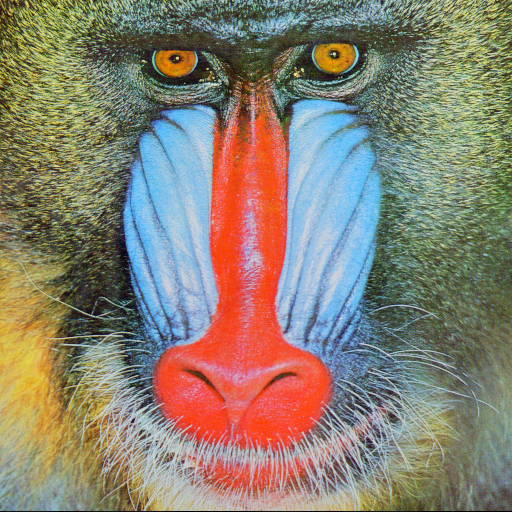


SVD-Only Compression


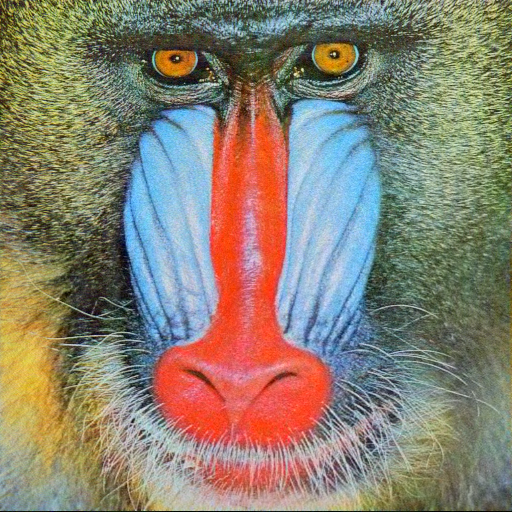

compression ratio: 0.33105214436848956 (3:1), nnz ratio = 1.0
Original DWT entropy (YCbCr) = [0.29402052750108965, 0.015052235721656482, 0.018023202391280965]
Compressed DWT entropy (YCbCr) = [0.2788482775702681, 0.014240460383951908, 0.016737275527347523]
RGB-MSE: 0.0024326427734082776
Y-MSE: 0.0005051105783895278
dE2000: 0.0009949003439587733
RGB-PSNR: 26.139216612821127
Y-PSNR: 32.966135360845776
dE2000-PSNR: 30.022204189892847

SVD+Thresholding Compression


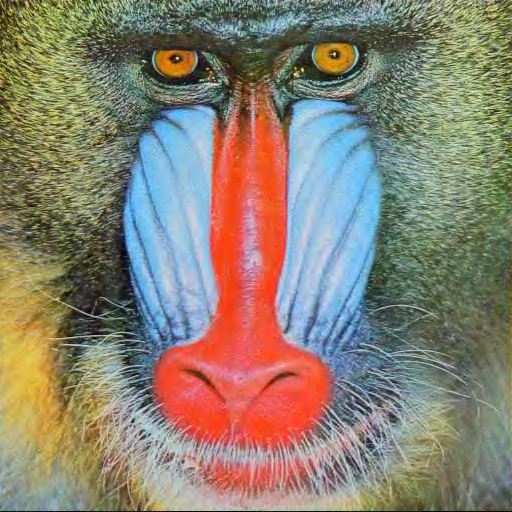

compression ratio: 0.1852877934773763 (5:1), nnz ratio = 1.0
Original DWT entropy (YCbCr) = [0.29402052750108965, 0.015052235721656482, 0.018023202391280965]
Compressed DWT entropy (YCbCr) = [0.2788482775702681, 0.014240460383951908, 0.016737275527347523]
RGB-MSE: 0.0031114156660140752
Y-MSE: 0.001000200530585698
dE2000: 0.0011165016390810192
RGB-PSNR: 25.070419659413087
Y-PSNR: 29.99912919404048
dE2000-PSNR: 29.521406350257546


(0.0031114156660140752, 0.001000200530585698, 0.0011165016390810192)

In [14]:
img = testimage("mandrill")
println("Original Image");
display(img)
wt = wavelet(WT.cdf97, WT.Lifting)

println("\nSVD-Only Compression");
rankRatio = [0.4 0.05 0.05]
compImg, svdBits, rleBits, nnzC, nnzO, dwtHComp, dwtHOrig = svdThreshCompress(img, wt, rankRatio, [1 1 1], 8)
display(compImg)
cr = svdBits / (24*length(compImg))
println("compression ratio: ", cr, " (", round(Int,1/cr), ":1), nnz ratio = ", nnzC/nnzO)
println("Original DWT entropy (YCbCr) = ", dwtHOrig)
println("Compressed DWT entropy (YCbCr) = ", dwtHComp)
rgbMSE, yMSE, cdiffMSE = evaluateMSE(img, compImg)


# next try hybrid method: moderate compression with SVD, then hard thresholding?
# perhaps an improvement, hard to tell
# with fine tuning of SVD compression, can achieve improvement in PSNR
# only very minimal improvement (~mdB) in PSNR --- no perceived impact
# however, most of the time, this underperforms just normal thresholding
# similar to: https://www.sciencedirect.com/science/article/pii/S1051200413001929
println("\nSVD+Thresholding Compression");
rankRatio = [0.4 0.05 0.05]
threshRatio = [0.2 0.05 0.05]
compImg, svdBits, rleBits, nnzComp, nnzOrig, dwtHComp, dwtHOrig = svdThreshCompress(img, wt, rankRatio, threshRatio, 8)
display(compImg)
cr = rleBits / (24*length(compImg))
println("compression ratio: ", cr, " (", round(Int,1/cr), ":1), nnz ratio = ", nnzC/nnzO)
println("Original DWT entropy (YCbCr) = ", dwtHOrig)
println("Compressed DWT entropy (YCbCr) = ", dwtHComp)
rgbMSE, yMSE, cdiffMSE = evaluateMSE(img, compImg)

Original Image


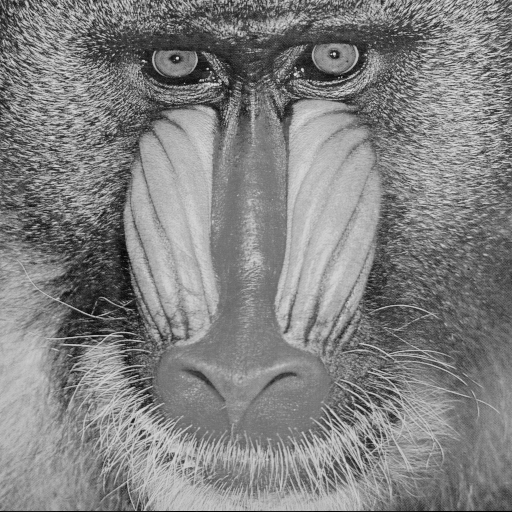

Wavelet Transform


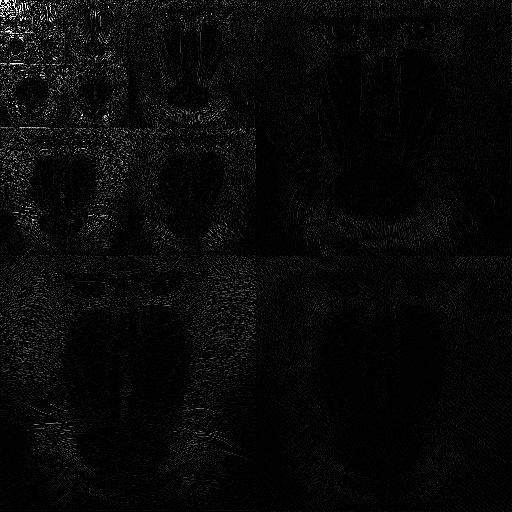

Log-amplitude Wavelet Transform


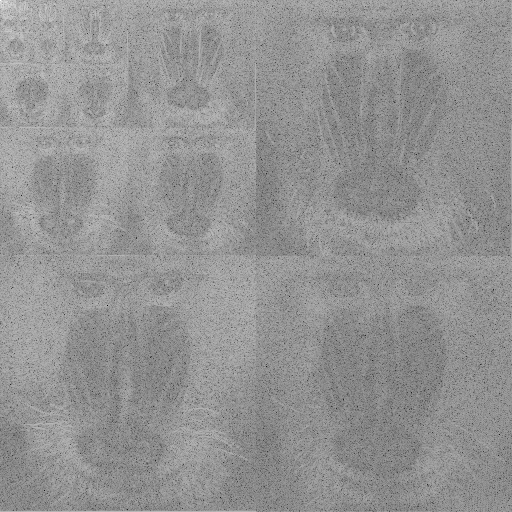

In [9]:
img = Gray.(testimage("mandrill"))
rawImg = convert(Array{Float32}, img)
println("Original Image");
display(img)
save("mandrill.png", Gray.(rawImg))
wt = wavelet(WT.cdf97, WT.Lifting)
dwt!(rawImg, wt)
println("Wavelet Transform");
maxDWT = maximum(rawImg)
minDWT = minimum(rawImg)
linDWT = (rawImg .- minDWT)./(maxDWT - minDWT)
display(Gray.(rawImg))
println("Log-amplitude Wavelet Transform");
logAbs = log2.(abs.(rawImg))
maxLog = maximum(logAbs)
minLog = minimum(logAbs)
logAbs = (logAbs .- minLog)./(maxLog - minLog)
display(Gray.(logAbs))

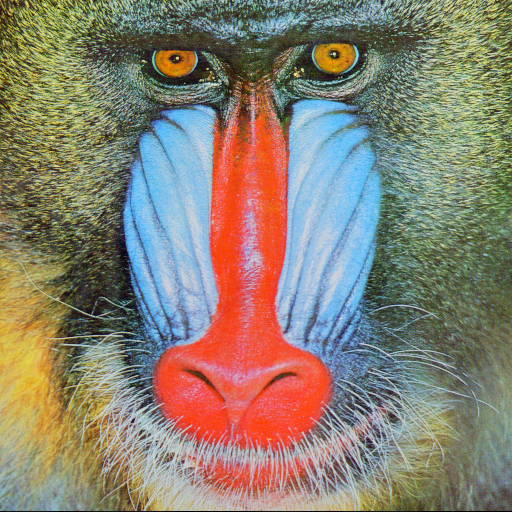

In [84]:
RGB.(red.(testimage("mandrill")), green.(testimage("mandrill")), blue.(testimage("mandrill")))

In [88]:
r = red.(testimage("mandrill"));
view(r, :, 1:5)

512×5 view(::Array{N0f8,2}, :, 1:5) with eltype N0f8:
 0.643  0.247  0.294  0.373  0.616
 0.471  0.529  0.216  0.294  0.455
 0.388  0.518  0.235  0.212  0.392
 0.251  0.588  0.443  0.196  0.318
 0.431  0.51   0.635  0.235  0.298
 0.38   0.322  0.702  0.318  0.29
 0.239  0.275  0.584  0.624  0.243
 0.212  0.247  0.451  0.733  0.373
 0.251  0.263  0.282  0.525  0.569
 0.216  0.212  0.2    0.29   0.616
 0.212  0.216  0.373  0.196  0.388
 0.2    0.231  0.357  0.231  0.243
 0.196  0.231  0.412  0.333  0.208
 ⋮                           
 0.561  0.525  0.518  0.467  0.435
 0.518  0.51   0.498  0.42   0.404
 0.502  0.498  0.455  0.439  0.471
 0.416  0.447  0.494  0.463  0.471
 0.459  0.471  0.447  0.475  0.537
 0.42   0.416  0.451  0.486  0.482
 0.38   0.388  0.451  0.49   0.525
 0.365  0.361  0.455  0.553  0.506
 0.376  0.463  0.522  0.447  0.471
 0.475  0.482  0.486  0.49   0.404
 0.494  0.459  0.475  0.416  0.396
 0.035  0.039  0.043  0.047  0.047

In [125]:
display(makeQuantizationTable.([10 50 100])[2])

8×8 Matrix{Float64}:
 16.0  11.0  10.0  16.0   24.0   40.0   51.0   61.0
 12.0  12.0  14.0  19.0   26.0   58.0   60.0   55.0
 14.0  13.0  16.0  24.0   40.0   57.0   69.0   56.0
 14.0  17.0  22.0  29.0   51.0   87.0   80.0   62.0
 18.0  22.0  37.0  56.0   68.0  109.0  103.0   77.0
 24.0  35.0  55.0  64.0   81.0  104.0  113.0   92.0
 49.0  64.0  78.0  87.0  103.0  121.0  120.0  101.0
 72.0  92.0  95.0  98.0  112.0  100.0  103.0   99.0

In [159]:
function lol!(arr)
    arr[1] = 7
end

a = [1 2 3; 4 5 6]
display(a)
lol!(view(a, 2,:))
display(a)

2×3 Matrix{Int64}:
 1  2  3
 4  5  6

2×3 Matrix{Int64}:
 1  2  3
 7  5  6

In [212]:
a[2,2]

5

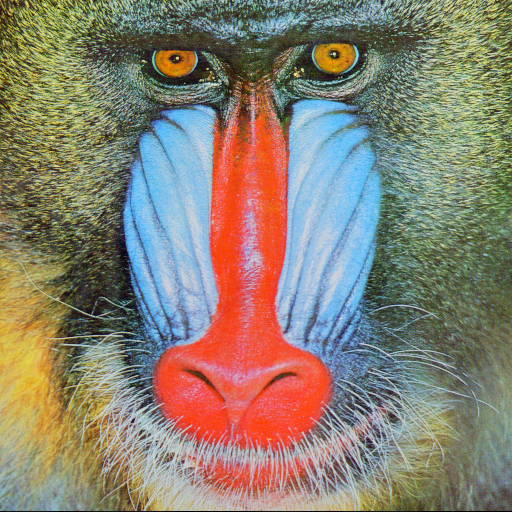

In [241]:
img = testimage("mandrill")

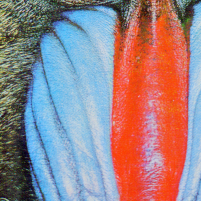

In [258]:
display(img[100:300, 100:300])

In [272]:
convert(Float32, minimum(red.(img)))

0.0f0

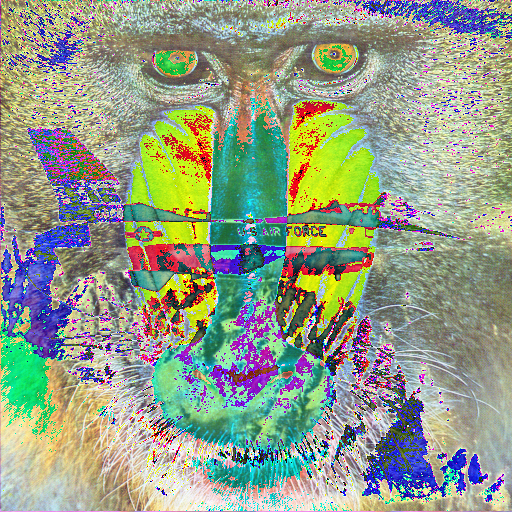

In [277]:
testimage("mandrill") - testimage("airplaneF16")

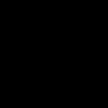

In [308]:
RGB.(zeros(9,9))

In [337]:
a,b,c = [1 2 3]

1×3 Matrix{Int64}:
 1  2  3

In [338]:
a

1

In [339]:
b

2

In [340]:
c

3

In [361]:
getproperty.(convert.(YCbCr, testimage("mandrill")), :y)

512×512 Matrix{Float32}:
 140.684    63.9481   57.9157   92.2867  …  112.693   147.798   168.294
 115.901   102.798    50.0197   73.9062     127.501   143.612   123.629
  81.7627  113.887    55.6012   55.8958     101.997    91.7551   85.7794
  76.9602  132.694    97.8485   57.2914      78.5807   80.6582   75.8445
  90.4119  120.431   129.236    58.7093      66.9883   84.2825   89.8056
  86.0946   81.2053  152.406    68.0224  …   89.359   146.53    172.023
  53.0728   60.2148  130.841   127.472      174.894   185.795   156.988
  44.4966   59.8172  111.553   147.74       154.637   119.298   134.87
  65.0423   57.4966   63.7532  116.305      131.617   150.034   120.348
  48.5073   43.1259   57.3816   71.1433      71.9712   85.5613  133.095
  44.6529   53.3528   64.6326   47.5317  …   71.8132   78.9887   74.4979
  44.6804   56.1715   82.8311   47.0284      92.1682   79.717    80.088
  46.538    73.7868   93.1172   71.541       81.846    97.4268  104.23
   ⋮                                 

In [372]:
print(convert.(YCbCr, testimage("mandrill")))

YCbCr{Float32}[YCbCr{Float32}(140.684f0,91.22683f0,139.7918f0) YCbCr{Float32}(63.948116f0,115.69105f0,132.49242f0) YCbCr{Float32}(57.91574f0,108.762726f0,144.412f0) YCbCr{Float32}(92.28672f0,106.769424f0,131.86774f0) YCbCr{Float32}(134.041f0,96.05275f0,140.2523f0) YCbCr{Float32}(93.55348f0,99.59375f0,133.4498f0) YCbCr{Float32}(68.89666f0,116.80047f0,146.42575f0) YCbCr{Float32}(44.636612f0,126.34227f0,139.06247f0) YCbCr{Float32}(76.83648f0,111.72175f0,136.87392f0) YCbCr{Float32}(81.92501f0,112.25464f0,148.82545f0) YCbCr{Float32}(94.90699f0,102.7783f0,141.23413f0) YCbCr{Float32}(140.91159f0,92.582664f0,130.85397f0) YCbCr{Float32}(147.51079f0,98.68804f0,139.82375f0) YCbCr{Float32}(108.49787f0,87.99319f0,143.22343f0) YCbCr{Float32}(79.76936f0,105.56727f0,139.12012f0) YCbCr{Float32}(141.68109f0,97.09577f0,135.93158f0) YCbCr{Float32}(172.95773f0,79.538055f0,136.29623f0) YCbCr{Float32}(119.3534f0,90.6503f0,137.81f0) YCbCr{Float32}(84.70674f0,109.657524f0,140.5305f0) YCbCr{Float32}(95.47553f0,

(162.2774f0,134.7801f0,116.51962f0) YCbCr{Float32}(161.1575f0,132.45216f0,113.57731f0) YCbCr{Float32}(179.78967f0,118.22721f0,121.28708f0) YCbCr{Float32}(170.02742f0,128.32372f0,120.89047f0) YCbCr{Float32}(153.4968f0,137.86552f0,113.52718f0) YCbCr{Float32}(130.05434f0,130.0806f0,120.60476f0) YCbCr{Float32}(145.35342f0,115.300934f0,121.34787f0) YCbCr{Float32}(152.98492f0,114.86172f0,121.4193f0) YCbCr{Float32}(160.78476f0,130.68439f0,116.35546f0) YCbCr{Float32}(155.03752f0,120.1214f0,123.0546f0) YCbCr{Float32}(159.31703f0,122.60846f0,123.06525f0) YCbCr{Float32}(134.10799f0,138.15106f0,115.141205f0) YCbCr{Float32}(96.96816f0,126.375f0,131.58516f0) YCbCr{Float32}(116.33807f0,105.7755f0,124.97248f0) YCbCr{Float32}(163.46602f0,122.196526f0,116.90558f0) YCbCr{Float32}(146.8555f0,136.24597f0,115.86611f0) YCbCr{Float32}(85.68065f0,129.916f0,124.782646f0) YCbCr{Float32}(93.69519f0,126.28132f0,119.56217f0) YCbCr{Float32}(73.527435f0,128.99937f0,133.64903f0) YCbCr{Float32}(76.74201f0,115.24638f0,1

,125.271034f0,116.40559f0) YCbCr{Float32}(149.32033f0,133.33604f0,112.18823f0) YCbCr{Float32}(157.5367f0,130.08058f0,120.604774f0) YCbCr{Float32}(169.95528f0,132.3312f0,107.78543f0) YCbCr{Float32}(177.05861f0,138.1456f0,116.387405f0) YCbCr{Float32}(116.40334f0,127.54987f0,130.56386f0) YCbCr{Float32}(83.88742f0,113.10485f0,121.704994f0) YCbCr{Float32}(125.627106f0,118.25995f0,113.80976f0) YCbCr{Float32}(146.38487f0,134.03899f0,118.71569f0) YCbCr{Float32}(96.936386f0,118.95743f0,121.58344f0) YCbCr{Float32}(116.15514f0,108.85546f0,123.22628f0) YCbCr{Float32}(180.52998f0,124.24438f0,116.98765f0) YCbCr{Float32}(170.74884f0,134.35179f0,114.09861f0) YCbCr{Float32}(152.79857f0,113.97783f0,122.80836f0) YCbCr{Float32}(131.9094f0,120.58243f0,117.99828f0) YCbCr{Float32}(146.2363f0,116.278496f0,131.98178f0) YCbCr{Float32}(107.48188f0,115.84473f0,130.80698f0) YCbCr{Float32}(156.51642f0,104.89162f0,126.361565f0) YCbCr{Float32}(148.73547f0,122.7676f0,120.13358f0) YCbCr{Float32}(107.05075f0,120.55515f0

(113.50825f0,109.88757f0,121.39798f0) YCbCr{Float32}(82.41454f0,124.365326f0,122.77953f0) YCbCr{Float32}(96.58083f0,120.15412f0,115.57727f0) YCbCr{Float32}(74.308105f0,120.12139f0,123.05459f0) YCbCr{Float32}(114.31726f0,104.46331f0,123.94056f0) YCbCr{Float32}(115.851974f0,111.01336f0,131.59268f0) YCbCr{Float32}(68.91727f0,120.258705f0,125.10782f0) YCbCr{Float32}(144.51779f0,80.586525f0,130.7293f0) YCbCr{Float32}(194.85086f0,103.58488f0,124.083405f0) YCbCr{Float32}(162.6716f0,111.74902f0,130.64282f0) YCbCr{Float32}(48.42488f0,133.07872f0,137.55183f0) YCbCr{Float32}(56.189507f0,120.66519f0,132.51372f0) YCbCr{Float32}(75.12485f0,121.13714f0,124.964966f0) YCbCr{Float32}(78.16938f0,114.4225f0,121.49071f0) YCbCr{Float32}(112.14443f0,94.81147f0,123.019516f0) YCbCr{Float32}(111.897095f0,111.80902f0,116.934395f0) YCbCr{Float32}(104.67696f0,109.036415f0,115.30973f0) YCbCr{Float32}(112.1702f0,102.728264f0,119.24138f0) YCbCr{Float32}(81.35733f0,111.095184f0,112.89938f0) YCbCr{Float32}(155.30118f0,

,115.516495f0) YCbCr{Float32}(124.63774f0,139.15588f0,119.54401f0) YCbCr{Float32}(85.8464f0,137.25626f0,119.02271f0) YCbCr{Float32}(104.60568f0,118.49639f0,126.63974f0) YCbCr{Float32}(156.77577f0,127.04972f0,111.134995f0) YCbCr{Float32}(169.34723f0,139.62239f0,113.24147f0) YCbCr{Float32}(123.53415f0,127.89542f0,118.46945f0) YCbCr{Float32}(127.31555f0,123.234085f0,113.83107f0) YCbCr{Float32}(169.60574f0,133.02869f0,115.559105f0) YCbCr{Float32}(144.73764f0,133.00687f0,120.54399f0) YCbCr{Float32}(116.17747f0,133.13327f0,125.089645f0) YCbCr{Float32}(113.84147f0,121.59272f0,121.15488f0) YCbCr{Float32}(139.61649f0,116.629486f0,118.64114f0) YCbCr{Float32}(173.22655f0,138.87035f0,117.93f0) YCbCr{Float32}(93.94854f0,139.02403f0,116.24456f0) YCbCr{Float32}(139.32019f0,126.71508f0,120.73696f0) YCbCr{Float32}(144.09267f0,138.83217f0,126.653534f0) YCbCr{Float32}(106.58613f0,127.76356f0,115.17003f0) YCbCr{Float32}(147.44208f0,123.514175f0,116.69131f0) YCbCr{Float32}(157.16998f0,137.72821f0,111.47397

,130.68542f0) YCbCr{Float32}(136.6106f0,98.03966f0,120.83409f0) YCbCr{Float32}(141.32297f0,106.225624f0,122.408615f0) YCbCr{Float32}(107.08081f0,117.56341f0,139.2448f0) YCbCr{Float32}(78.33856f0,115.812004f0,138.28429f0) YCbCr{Float32}(72.46507f0,121.68094f0,134.42409f0) YCbCr{Float32}(125.40982f0,115.410965f0,129.63217f0) YCbCr{Float32}(120.06622f0,112.05093f0,128.51817f0) YCbCr{Float32}(127.50106f0,112.22096f0,123.09408f0) YCbCr{Float32}(143.61172f0,117.79346f0,120.1123f0) YCbCr{Float32}(123.629486f0,102.55822f0,124.66548f0); YCbCr{Float32}(81.762695f0,105.408134f0,142.05177f0) YCbCr{Float32}(113.886986f0,94.30134f0,139.2918f0) YCbCr{Float32}(55.60121f0,122.98768f0,136.70222f0) YCbCr{Float32}(55.89579f0,119.34754f0,132.728f0) YCbCr{Float32}(100.10974f0,104.732475f0,129.29321f0) YCbCr{Float32}(67.4358f0,113.18216f0,137.46663f0) YCbCr{Float32}(67.448685f0,117.14056f0,135.57758f0) YCbCr{Float32}(56.516716f0,119.484856f0,134.78122f0) YCbCr{Float32}(109.00716f0,98.60528f0,125.30833f0) YCb

(163.62662f0,132.0184f0,112.40253f0) YCbCr{Float32}(122.30346f0,138.02466f0,110.59553f0) YCbCr{Float32}(85.90652f0,120.86251f0,120.85852f0) YCbCr{Float32}(145.8275f0,104.61699f0,122.25511f0) YCbCr{Float32}(138.67178f0,121.63636f0,111.18512f0) YCbCr{Float32}(170.29195f0,131.14543f0,111.299164f0) YCbCr{Float32}(146.8014f0,145.20032f0,109.01348f0) YCbCr{Float32}(115.52305f0,135.49394f0,120.55464f0) YCbCr{Float32}(114.16611f0,124.87546f0,106.507256f0) YCbCr{Float32}(156.51985f0,125.71025f0,116.33416f0) YCbCr{Float32}(169.77321f0,133.9235f0,111.677605f0) YCbCr{Float32}(148.56886f0,133.7698f0,113.36304f0) YCbCr{Float32}(142.72629f0,128.21913f0,111.359924f0) YCbCr{Float32}(119.182495f0,132.88593f0,114.75211f0) YCbCr{Float32}(104.31798f0,130.06422f0,124.34342f0) YCbCr{Float32}(77.67297f0,121.1535f0,121.22631f0) YCbCr{Float32}(122.16691f0,125.71024f0,116.33415f0) YCbCr{Float32}(128.72574f0,122.915825f0,119.69438f0) YCbCr{Float32}(84.86562f0,118.984695f0,115.35234f0) YCbCr{Float32}(136.76433f0,1

Float32}(177.17627f0,133.61613f0,115.04847f0) YCbCr{Float32}(156.98361f0,136.84431f0,112.863045f0) YCbCr{Float32}(156.79381f0,131.99658f0,117.387405f0) YCbCr{Float32}(108.55455f0,118.19994f0,127.51818f0) YCbCr{Float32}(169.61777f0,121.619995f0,114.92379f0) YCbCr{Float32}(171.98468f0,138.59572f0,113.82355f0) YCbCr{Float32}(123.675f0,142.68597f0,115.23392f0) YCbCr{Float32}(95.424f0,119.8304f0,122.686806f0) YCbCr{Float32}(117.87966f0,120.25325f0,126.35404f0) YCbCr{Float32}(150.87566f0,129.95964f0,114.81288f0) YCbCr{Float32}(141.1761f0,115.72924f0,123.76887f0) YCbCr{Float32}(162.55136f0,120.74156f0,115.066635f0) YCbCr{Float32}(143.03632f0,140.92912f0,115.51963f0) YCbCr{Float32}(117.616f0,125.85847f0,115.89495f0) YCbCr{Float32}(147.84486f0,118.820114f0,119.53023f0) YCbCr{Float32}(145.71327f0,133.43518f0,122.965f0) YCbCr{Float32}(98.055435f0,122.773056f0,118.88738f0) YCbCr{Float32}(97.851036f0,120.412384f0,123.422386f0) YCbCr{Float32}(175.72916f0,119.08383f0,126.1291f0) YCbCr{Float32}(105.45

,127.93609f0) YCbCr{Float32}(80.567215f0,123.448715f0,131.64594f0) YCbCr{Float32}(61.88007f0,117.87622f0,134.6277f0) YCbCr{Float32}(91.78688f0,102.596405f0,115.94193f0) YCbCr{Float32}(129.13712f0,99.37913f0,115.634926f0) YCbCr{Float32}(177.75598f0,99.57193f0,138.43466f0) YCbCr{Float32}(63.43626f0,126.39681f0,126.60027f0) YCbCr{Float32}(117.869354f0,88.03683f0,133.25368f0) YCbCr{Float32}(142.58028f0,82.20062f0,129.63658f0) YCbCr{Float32}(151.5318f0,104.29871f0,128.11844f0) YCbCr{Float32}(89.69135f0,123.635124f0,122.48318f0) YCbCr{Float32}(108.771835f0,107.66422f0,127.98623f0) YCbCr{Float32}(137.79921f0,88.92617f0,130.61838f0) YCbCr{Float32}(90.79923f0,117.04688f0,123.55459f0) YCbCr{Float32}(87.61987f0,121.85644f0,127.75376f0) YCbCr{Float32}(103.927216f0,106.4948f0,127.76129f0) YCbCr{Float32}(61.806213f0,114.94448f0,135.93471f0) YCbCr{Float32}(111.149055f0,99.35185f0,121.86602f0) YCbCr{Float32}(124.89453f0,118.6828f0,117.47699f0) YCbCr{Float32}(104.319695f0,103.293884f0,123.715614f0) YCb

,137.87097f0,112.280975f0) YCbCr{Float32}(123.366684f0,140.38531f0,106.060524f0) YCbCr{Float32}(151.43733f0,141.53293f0,111.27034f0) YCbCr{Float32}(97.99618f0,151.06381f0,106.39948f0) YCbCr{Float32}(98.85672f0,148.08844f0,117.67623f0) YCbCr{Float32}(121.05902f0,132.2985f0,115.26275f0) YCbCr{Float32}(149.51357f0,142.14764f0,104.52859f0) YCbCr{Float32}(165.1974f0,138.05193f0,104.36443f0) YCbCr{Float32}(177.3532f0,134.50548f0,112.41318f0) YCbCr{Float32}(160.16899f0,144.92024f0,106.153244f0) YCbCr{Float32}(113.9806f0,139.35867f0,106.642586f0) YCbCr{Float32}(100.38972f0,123.90429f0,127.835846f0) YCbCr{Float32}(117.21751f0,133.0287f0,115.559105f0) YCbCr{Float32}(154.89925f0,127.63715f0,110.62435f0) YCbCr{Float32}(164.92f0,131.27182f0,115.84482f0) YCbCr{Float32}(126.243744f0,136.24597f0,115.86612f0) YCbCr{Float32}(129.82332f0,138.1456f0,116.38741f0) YCbCr{Float32}(110.022285f0,126.27586f0,120.80839f0) YCbCr{Float32}(140.91846f0,134.21994f0,110.799164f0) YCbCr{Float32}(166.34564f0,136.89342f0,

,126.700516f0) YCbCr{Float32}(153.32072f0,98.30883f0,126.18675f0) YCbCr{Float32}(176.21095f0,94.51502f0,123.89794f0) YCbCr{Float32}(197.96066f0,98.31975f0,123.69431f0) YCbCr{Float32}(192.2323f0,104.600624f0,125.993774f0) YCbCr{Float32}(175.70338f0,111.16704f0,129.90724f0) YCbCr{Float32}(95.97365f0,125.9576f0,126.6717f0) YCbCr{Float32}(124.48144f0,91.16043f0,121.53771f0) YCbCr{Float32}(151.39352f0,98.42978f0,131.97864f0) YCbCr{Float32}(128.27057f0,116.73407f0,128.17169f0) YCbCr{Float32}(119.453026f0,98.02875f0,123.32653f0) YCbCr{Float32}(136.37184f0,103.13475f0,126.64728f0) YCbCr{Float32}(144.93431f0,112.07274f0,123.53329f0) YCbCr{Float32}(151.99643f0,93.62023f0,127.779465f0) YCbCr{Float32}(164.53352f0,113.64865f0,131.16411f0) YCbCr{Float32}(137.31398f0,126.38591f0,129.09271f0) YCbCr{Float32}(110.87252f0,104.46876f0,122.694336f0) YCbCr{Float32}(129.12595f0,109.30013f0,121.90863f0) YCbCr{Float32}(167.4226f0,111.485306f0,124.04394f0) YCbCr{Float32}(109.83248f0,121.42813f0,125.33275f0) YCb

Float32}(61.45753f0,124.06888f0,123.65797f0) YCbCr{Float32}(94.1787f0,115.59193f0,121.71565f0) YCbCr{Float32}(77.05463f0,129.93782f0,119.79777f0) YCbCr{Float32}(62.76895f0,124.79909f0,123.95433f0) YCbCr{Float32}(75.37305f0,116.03659f0,120.398f0) YCbCr{Float32}(102.30404f0,119.82494f0,123.93302f0) YCbCr{Float32}(86.312744f0,136.98709f0,113.670044f0) YCbCr{Float32}(78.23637f0,126.28133f0,119.56217f0) YCbCr{Float32}(95.9934f0,120.988914f0,125.40418f0) YCbCr{Float32}(65.63828f0,127.60442f0,118.10166f0) YCbCr{Float32}(59.805153f0,128.98846f0,136.14146f0) YCbCr{Float32}(59.23919f0,131.79381f0,130.28882f0) YCbCr{Float32}(48.402554f0,125.6557f0,128.79636f0) YCbCr{Float32}(71.34602f0,114.395226f0,127.72181f0) YCbCr{Float32}(165.5959f0,117.49701f0,120.99073f0) YCbCr{Float32}(127.36107f0,146.50706f0,111.291626f0) YCbCr{Float32}(62.738037f0,136.21869f0,122.09722f0) YCbCr{Float32}(66.4679f0,122.663956f0,143.81177f0) YCbCr{Float32}(81.4372f0,113.5277f0,125.37223f0) YCbCr{Float32}(137.29337f0,125.902

(124.75454f0,139.5842f0,121.96502f0) YCbCr{Float32}(135.46664f0,105.144424f0,135.45288f0) YCbCr{Float32}(99.54807f0,110.01398f0,125.94364f0) YCbCr{Float32}(173.9471f0,112.67655f0,119.28399f0) YCbCr{Float32}(172.11522f0,124.63995f0,126.88599f0) YCbCr{Float32}(100.85606f0,123.63512f0,122.483185f0) YCbCr{Float32}(144.25757f0,127.33525f0,112.74901f0) YCbCr{Float32}(158.91768f0,131.26637f0,117.09104f0) YCbCr{Float32}(125.20199f0,122.47115f0,121.012024f0) YCbCr{Float32}(154.73692f0,110.876045f0,129.53944f0) YCbCr{Float32}(142.16203f0,111.19431f0,123.67615f0) YCbCr{Float32}(174.78015f0,104.75976f0,123.06212f0) YCbCr{Float32}(184.53123f0,121.43904f0,122.8403f0) YCbCr{Float32}(159.66916f0,130.83261f0,115.916245f0) YCbCr{Float32}(115.62611f0,133.45154f0,119.22634f0) YCbCr{Float32}(155.33038f0,106.071945f0,124.09405f0) YCbCr{Float32}(198.37204f0,115.432785f0,124.6473f0) YCbCr{Float32}(167.20877f0,125.98487f0,120.440605f0) YCbCr{Float32}(142.28828f0,111.61716f0,127.34337f0) YCbCr{Float32}(102.1760

) YCbCr{Float32}(173.18446f0,106.17653f0,133.62459f0) YCbCr{Float32}(89.95759f0,126.95153f0,133.56696f0) YCbCr{Float32}(95.75808f0,109.722984f0,125.57586f0) YCbCr{Float32}(169.54047f0,114.7244f0,119.36606f0) YCbCr{Float32}(184.88335f0,112.8084f0,122.58342f0) YCbCr{Float32}(181.73662f0,116.60767f0,123.62602f0) YCbCr{Float32}(156.26564f0,101.07053f0,130.30386f0) YCbCr{Float32}(141.83655f0,109.39926f0,132.6854f0) YCbCr{Float32}(109.74231f0,103.63397f0,112.86744f0) YCbCr{Float32}(166.33191f0,104.18322f0,121.08032f0) YCbCr{Float32}(170.29967f0,120.73065f0,117.55908f0) YCbCr{Float32}(159.43555f0,113.12122f0,117.96633f0) YCbCr{Float32}(166.99835f0,127.59351f0,120.59411f0) YCbCr{Float32}(104.21664f0,129.13124f0,136.94849f0) YCbCr{Float32}(108.121704f0,112.501045f0,125.9543f0) YCbCr{Float32}(173.51167f0,101.526115f0,126.493774f0) YCbCr{Float32}(147.38797f0,119.08383f0,126.129105f0) YCbCr{Float32}(154.28519f0,105.18806f0,125.48313f0) YCbCr{Float32}(98.40412f0,127.03335f0,114.87366f0) YCbCr{Float

,111.45266f0) YCbCr{Float32}(102.06013f0,123.931564f0,121.60475f0) YCbCr{Float32}(153.54832f0,133.37424f0,103.4647f0) YCbCr{Float32}(152.145f0,145.09029f0,100.72915f0) YCbCr{Float32}(133.67514f0,132.45216f0,113.57731f0) YCbCr{Float32}(157.46971f0,131.60646f0,106.24284f0) YCbCr{Float32}(135.67792f0,145.67227f0,101.46474f0) YCbCr{Float32}(106.89273f0,136.50969f0,122.46501f0) YCbCr{Float32}(98.75881f0,127.32434f0,115.241455f0) YCbCr{Float32}(73.78336f0,147.19363f0,121.55775f0) YCbCr{Float32}(75.0321f0,121.68639f0,133.17786f0) YCbCr{Float32}(94.108284f0,116.62403f0,119.88735f0) YCbCr{Float32}(159.30243f0,138.48022f0,106.78544f0) YCbCr{Float32}(136.10648f0,135.5103f0,116.81598f0) YCbCr{Float32}(107.57464f0,128.68018f0,106.30363f0) YCbCr{Float32}(94.42605f0,132.30394f0,114.01652f0) YCbCr{Float32}(90.52785f0,123.15227f0,132.52435f0) YCbCr{Float32}(71.016235f0,126.9788f0,127.33585f0) YCbCr{Float32}(69.28399f0,129.46587f0,127.346504f0) YCbCr{Float32}(119.24863f0,112.522865f0,120.96942f0) YCbCr{

,124.8478f0) YCbCr{Float32}(161.86002f0,87.92679f0,124.96935f0) YCbCr{Float32}(171.23064f0,96.39829f0,128.15791f0) YCbCr{Float32}(121.849144f0,113.50043f0,131.60333f0) YCbCr{Float32}(92.970345f0,99.434616f0,136.38144f0) YCbCr{Float32}(87.42234f0,110.56869f0,132.91032f0) YCbCr{Float32}(119.44272f0,102.99198f0,125.84028f0) YCbCr{Float32}(92.129555f0,100.9114f0,133.23552f0) YCbCr{Float32}(95.560555f0,115.29002f0,123.8403f0) YCbCr{Float32}(113.90073f0,110.156746f0,126.75065f0) YCbCr{Float32}(137.21521f0,90.25473f0,127.91167f0) YCbCr{Float32}(127.14121f0,97.55681f0,130.87527f0) YCbCr{Float32}(74.09683f0,113.30311f0,143.25851f0) YCbCr{Float32}(61.935036f0,120.81887f0,130.82828f0) YCbCr{Float32}(89.358986f0,110.44228f0,128.36467f0) YCbCr{Float32}(146.53001f0,93.80118f0,119.86292f0) YCbCr{Float32}(172.02333f0,96.43647f0,119.434364f0); YCbCr{Float32}(53.072834f0,118.002625f0,139.17337f0) YCbCr{Float32}(60.214813f0,115.36733f0,139.60194f0) YCbCr{Float32}(130.84102f0,86.993805f0,137.57442f0) YCbC

(121.42574f0,117.710686f0,105.59687f0) YCbCr{Float32}(87.751274f0,133.18237f0,113.87367f0) YCbCr{Float32}(74.400856f0,143.3671f0,126.74626f0) YCbCr{Float32}(75.43746f0,118.973785f0,117.84478f0) YCbCr{Float32}(133.6408f0,119.583046f0,112.34926f0) YCbCr{Float32}(113.46015f0,148.58218f0,105.14262f0) YCbCr{Float32}(99.01131f0,124.69996f0,113.17757f0) YCbCr{Float32}(121.80878f0,134.8401f0,102.811195f0) YCbCr{Float32}(120.394295f0,139.62239f0,113.24147f0) YCbCr{Float32}(108.9977f0,132.3203f0,110.27786f0) YCbCr{Float32}(69.38533f0,133.86894f0,124.13979f0) YCbCr{Float32}(64.70904f0,135.5767f0,135.07005f0) YCbCr{Float32}(63.059235f0,122.152885f0,126.87533f0) YCbCr{Float32}(83.5396f0,120.74156f0,115.06664f0) YCbCr{Float32}(161.8102f0,133.06688f0,106.83557f0) YCbCr{Float32}(172.32564f0,136.41602f0,110.44203f0) YCbCr{Float32}(129.8757f0,128.69653f0,102.56496f0) YCbCr{Float32}(153.08112f0,121.7464f0,119.469444f0) YCbCr{Float32}(102.42685f0,129.66864f0,114.44509f0) YCbCr{Float32}(69.91437f0,126.1276

) YCbCr{Float32}(149.83562f0,130.06422f0,124.34342f0) YCbCr{Float32}(124.906555f0,131.06906f0,128.74623f0) YCbCr{Float32}(141.57976f0,122.93219f0,115.95572f0) YCbCr{Float32}(170.79092f0,116.48126f0,119.08035f0) YCbCr{Float32}(196.97989f0,120.69792f0,125.036385f0) YCbCr{Float32}(168.2282f0,118.95197f0,122.82966f0) YCbCr{Float32}(177.78517f0,107.98248f0,122.12292f0) YCbCr{Float32}(156.39961f0,107.933395f0,133.3389f0) YCbCr{Float32}(66.77193f0,119.01837f0,141.08374f0) YCbCr{Float32}(104.62801f0,105.59454f0,132.88902f0) YCbCr{Float32}(142.45918f0,116.47581f0,120.326584f0) YCbCr{Float32}(122.07243f0,115.85018f0,129.56075f0) YCbCr{Float32}(110.83902f0,106.96674f0,120.21254f0) YCbCr{Float32}(177.63747f0,102.11901f0,124.73689f0) YCbCr{Float32}(191.06773f0,114.69167f0,126.84338f0) YCbCr{Float32}(117.86849f0,126.70417f0,123.22941f0) YCbCr{Float32}(149.55736f0,121.30173f0,120.7871f0) YCbCr{Float32}(144.9034f0,120.02226f0,112.27784f0) YCbCr{Float32}(164.15994f0,126.75327f0,112.013435f0) YCbCr{Floa

,132.27812f0) YCbCr{Float32}(104.682976f0,108.5372f0,129.08958f0) YCbCr{Float32}(183.08583f0,96.99119f0,126.40103f0) YCbCr{Float32}(182.8591f0,124.387146f0,117.794655f0) YCbCr{Float32}(157.89311f0,123.92611f0,122.85097f0) YCbCr{Float32}(92.391495f0,111.66625f0,116.1274f0) YCbCr{Float32}(160.32616f0,117.06871f0,118.569725f0) YCbCr{Float32}(154.6124f0,120.86252f0,120.85852f0) YCbCr{Float32}(113.46874f0,119.82494f0,123.93303f0) YCbCr{Float32}(92.59503f0,122.45478f0,124.75069f0) YCbCr{Float32}(124.77945f0,111.80902f0,116.9344f0) YCbCr{Float32}(117.48546f0,106.104675f0,116.61674f0) YCbCr{Float32}(175.38391f0,115.3173f0,117.6092f0) YCbCr{Float32}(134.29865f0,141.51111f0,116.2552f0) YCbCr{Float32}(66.76849f0,128.43921f0,127.92857f0) YCbCr{Float32}(120.51024f0,107.82881f0,123.808334f0) YCbCr{Float32}(159.53517f0,123.96975f0,112.88121f0) YCbCr{Float32}(179.52515f0,128.7902f0,114.587944f0) YCbCr{Float32}(169.37042f0,138.61755f0,108.83867f0) YCbCr{Float32}(166.83775f0,134.62642f0,118.20505f0) YCb

,113.58797f0) YCbCr{Float32}(168.8998f0,136.41057f0,111.68825f0) YCbCr{Float32}(147.32872f0,143.9045f0,104.242874f0) YCbCr{Float32}(169.46146f0,131.12906f0,115.03782f0) YCbCr{Float32}(140.35164f0,125.128265f0,115.59858f0) YCbCr{Float32}(163.35179f0,127.219765f0,105.71091f0) YCbCr{Float32}(165.17078f0,135.09291f0,111.90253f0) YCbCr{Float32}(140.82915f0,138.73305f0,115.87676f0) YCbCr{Float32}(102.62094f0,140.46263f0,121.82216f0) YCbCr{Float32}(66.78739f0,128.4283f0,130.42102f0) YCbCr{Float32}(90.00482f0,123.45417f0,130.39972f0) YCbCr{Float32}(110.04977f0,127.74719f0,118.908676f0) YCbCr{Float32}(69.050385f0,132.07935f0,131.90282f0) YCbCr{Float32}(81.04643f0,130.60802f0,133.80254f0) YCbCr{Float32}(81.0619f0,136.54787f0,113.74146f0) YCbCr{Float32}(65.54295f0,122.70213f0,135.08823f0) YCbCr{Float32}(98.30278f0,122.63029f0,118.08037f0) YCbCr{Float32}(141.29118f0,135.98772f0,108.02101f0) YCbCr{Float32}(92.461914f0,130.95901f0,120.46191f0) YCbCr{Float32}(95.39394f0,129.76231f0,126.46808f0) YCbCr

,112.9239f0,129.62152f0) YCbCr{Float32}(69.11137f0,117.66799f0,148.77534f0) YCbCr{Float32}(106.39633f0,102.59095f0,117.18816f0) YCbCr{Float32}(159.03534f0,93.027336f0,129.53632f0) YCbCr{Float32}(154.6373f0,100.02751f0,134.62459f0) YCbCr{Float32}(119.29758f0,102.58004f0,119.680595f0) YCbCr{Float32}(134.86977f0,99.044495f0,125.23689f0); YCbCr{Float32}(65.04226f0,126.95698f0,132.32072f0) YCbCr{Float32}(57.496635f0,122.38933f0,139.70532f0) YCbCr{Float32}(63.753166f0,113.32493f0,138.27365f0) YCbCr{Float32}(116.30457f0,94.88878f0,138.78116f0) YCbCr{Float32}(141.65877f0,89.672745f0,127.176094f0) YCbCr{Float32}(125.93886f0,94.28497f0,143.03046f0) YCbCr{Float32}(66.89045f0,113.001205f0,145.38316f0) YCbCr{Float32}(45.67235f0,127.231606f0,136.42717f0) YCbCr{Float32}(72.04768f0,112.007286f0,138.48792f0) YCbCr{Float32}(128.91898f0,98.01784f0,125.81896f0) YCbCr{Float32}(166.0253f0,85.522484f0,139.47414f0) YCbCr{Float32}(76.45774f0,113.92328f0,135.27055f0) YCbCr{Float32}(114.9296f0,99.6483f0,120.9875

,116.90411f0,122.74759f0) YCbCr{Float32}(125.86328f0,128.0382f0,119.27646f0) YCbCr{Float32}(108.1114f0,134.31906f0,121.57593f0) YCbCr{Float32}(84.47743f0,124.66177f0,121.90111f0) YCbCr{Float32}(76.24905f0,125.94124f0,130.41035f0) YCbCr{Float32}(97.28249f0,117.76618f0,126.34338f0) YCbCr{Float32}(136.55649f0,123.8488f0,107.089325f0) YCbCr{Float32}(167.9654f0,139.92429f0,111.11683f0) YCbCr{Float32}(117.5576f0,135.80676f0,115.93755f0) YCbCr{Float32}(100.026436f0,138.98586f0,124.968094f0) YCbCr{Float32}(93.08886f0,123.65694f0,117.4983f0) YCbCr{Float32}(135.3447f0,120.58243f0,117.99829f0) YCbCr{Float32}(153.42894f0,144.34917f0,102.92524f0) YCbCr{Float32}(102.9284f0,123.92611f0,122.85097f0) YCbCr{Float32}(91.72333f0,118.49639f0,126.639755f0) YCbCr{Float32}(105.14503f0,122.64665f0,114.34171f0) YCbCr{Float32}(103.473755f0,127.57715f0,124.33276f0) YCbCr{Float32}(102.54966f0,122.657555f0,111.84927f0) YCbCr{Float32}(61.589787f0,120.52242f0,131.70671f0) YCbCr{Float32}(80.94509f0,122.73487f0,127.610

,126.68234f0) YCbCr{Float32}(94.515366f0,117.87622f0,134.62772f0) YCbCr{Float32}(68.07047f0,132.64497f0,136.37704f0) YCbCr{Float32}(77.259026f0,118.91378f0,131.5532f0) YCbCr{Float32}(124.589645f0,106.96129f0,121.45876f0) YCbCr{Float32}(144.67924f0,122.63029f0,118.08037f0) YCbCr{Float32}(155.45749f0,118.39181f0,117.109215f0) YCbCr{Float32}(172.69493f0,117.36515f0,117.69128f0) YCbCr{Float32}(148.8995f0,119.69854f0,119.38737f0) YCbCr{Float32}(100.61731f0,108.405334f0,125.790146f0) YCbCr{Float32}(93.83432f0,117.27787f0,137.63078f0) YCbCr{Float32}(60.23113f0,126.75966f0,143.97592f0) YCbCr{Float32}(84.86219f0,118.49094f0,127.88596f0) YCbCr{Float32}(131.14763f0,109.12463f0,128.57895f0) YCbCr{Float32}(90.177444f0,121.86735f0,125.26132f0) YCbCr{Float32}(176.37413f0,113.25853f0,120.019554f0) YCbCr{Float32}(174.68654f0,123.65148f0,118.74452f0) YCbCr{Float32}(158.66432f0,118.52367f0,120.40865f0) YCbCr{Float32}(140.54144f0,116.5913f0,127.364685f0) YCbCr{Float32}(131.57188f0,109.87121f0,125.13664f0)

,122.79487f0,113.9025f0) YCbCr{Float32}(73.02932f0,118.3809f0,119.60165f0) YCbCr{Float32}(104.9621f0,95.48713f0,135.77808f0) YCbCr{Float32}(148.05786f0,105.80823f0,117.49516f0) YCbCr{Float32}(163.63777f0,129.03757f0,124.9255f0) YCbCr{Float32}(87.61987f0,121.85644f0,127.75376f0) YCbCr{Float32}(114.98027f0,103.58488f0,124.083405f0) YCbCr{Float32}(160.05905f0,122.18015f0,120.644226f0) YCbCr{Float32}(146.1882f0,117.79346f0,120.11229f0) YCbCr{Float32}(183.11075f0,109.86575f0,126.38286f0) YCbCr{Float32}(150.73395f0,120.12685f0,121.80838f0) YCbCr{Float32}(173.50394f0,111.94089f0,120.23384f0) YCbCr{Float32}(145.9838f0,128.81749f0,108.35685f0) YCbCr{Float32}(174.30608f0,115.4437f0,122.15486f0) YCbCr{Float32}(119.1095f0,108.141624f0,119.191246f0) YCbCr{Float32}(141.2826f0,100.795906f0,126.19741f0) YCbCr{Float32}(104.74739f0,108.0043f0,117.13804f0) YCbCr{Float32}(151.30336f0,121.28536f0,124.52575f0) YCbCr{Float32}(79.491104f0,133.98444f0,131.1779f0) YCbCr{Float32}(88.67622f0,129.6741f0,113.198875

,119.36936f0,127.74311f0) YCbCr{Float32}(87.79679f0,122.74578f0,125.11848f0) YCbCr{Float32}(140.14122f0,126.7369f0,115.75209f0) YCbCr{Float32}(96.52329f0,128.61472f0,121.258255f0) YCbCr{Float32}(109.30087f0,116.77771f0,118.20193f0) YCbCr{Float32}(76.71883f0,129.63591f0,121.92241f0) YCbCr{Float32}(86.877846f0,122.284744f0,130.17477f0) YCbCr{Float32}(96.068115f0,115.4928f0,110.93889f0) YCbCr{Float32}(124.8576f0,134.07172f0,111.23838f0) YCbCr{Float32}(84.11072f0,135.77948f0,122.16865f0) YCbCr{Float32}(71.07721f0,122.482056f0,118.51959f0) YCbCr{Float32}(82.17922f0,133.42427f0,125.457436f0) YCbCr{Float32}(67.10773f0,132.70497f0,122.66863f0) YCbCr{Float32}(67.45985f0,127.54442f0,131.81009f0) YCbCr{Float32}(73.73441f0,119.9568f0,127.23247f0) YCbCr{Float32}(80.20565f0,128.61472f0,121.258255f0) YCbCr{Float32}(88.0072f0,134.52184f0,108.67451f0) YCbCr{Float32}(129.62149f0,137.76639f0,102.75042f0) YCbCr{Float32}(107.128044f0,144.30553f0,112.89499f0) YCbCr{Float32}(69.05554f0,126.12764f0,121.247604

) YCbCr{Float32}(141.38051f0,121.55999f0,128.6322f0) YCbCr{Float32}(83.441696f0,130.7126f0,143.33307f0) YCbCr{Float32}(74.27633f0,119.64399f0,131.84955f0) YCbCr{Float32}(95.57687f0,106.35748f0,125.70806f0) YCbCr{Float32}(94.253426f0,117.03597f0,126.047035f0) YCbCr{Float32}(110.11246f0,103.42029f0,128.26128f0) YCbCr{Float32}(84.34174f0,110.85968f0,133.27812f0) YCbCr{Float32}(71.971245f0,120.47878f0,141.67645f0) YCbCr{Float32}(85.56127f0,107.181366f0,138.0274f0) YCbCr{Float32}(133.09457f0,90.6503f0,137.81f0); YCbCr{Float32}(44.65293f0,117.40973f0,140.93024f0) YCbCr{Float32}(53.35281f0,116.84956f0,135.20978f0) YCbCr{Float32}(64.6326f0,110.33864f0,152.04283f0) YCbCr{Float32}(47.531708f0,120.20961f0,136.32379f0) YCbCr{Float32}(86.69148f0,104.546074f0,138.45598f0) YCbCr{Float32}(70.502655f0,113.89055f0,142.74786f0) YCbCr{Float32}(89.31948f0,103.52487f0,137.79181f0) YCbCr{Float32}(102.49297f0,95.92089f0,136.95285f0) YCbCr{Float32}(70.36868f0,107.02769f0,139.71284f0) YCbCr{Float32}(151.8092f0,

,120.38511f0,129.65349f0) YCbCr{Float32}(74.583786f0,119.96226f0,125.98626f0) YCbCr{Float32}(100.793365f0,110.78237f0,117.51647f0) YCbCr{Float32}(153.65224f0,129.84415f0,107.77477f0) YCbCr{Float32}(150.05634f0,140.34714f0,114.784065f0) YCbCr{Float32}(70.02859f0,137.9592f0,125.55016f0) YCbCr{Float32}(63.862236f0,124.16801f0,134.43472f0) YCbCr{Float32}(81.30838f0,124.508095f0,123.58654f0) YCbCr{Float32}(70.6375f0,129.18033f0,125.73249f0) YCbCr{Float32}(91.938034f0,119.363914f0,128.98933f0) YCbCr{Float32}(109.04408f0,130.31064f0,101.47225f0) YCbCr{Float32}(105.73933f0,133.20964f0,107.64258f0) YCbCr{Float32}(112.214f0,132.4467f0,114.82353f0) YCbCr{Float32}(93.64881f0,128.29099f0,128.36778f0) YCbCr{Float32}(87.61128f0,116.90411f0,122.74758f0) YCbCr{Float32}(84.78575f0,126.96243f0,131.07452f0) YCbCr{Float32}(74.91873f0,125.22194f0,127.62156f0) YCbCr{Float32}(101.50104f0,117.80982f0,116.373634f0) YCbCr{Float32}(69.29f0,125.49657f0,131.72801f0) YCbCr{Float32}(90.60428f0,111.21067f0,119.93748f0

,121.51202f0) YCbCr{Float32}(146.3986f0,119.65491f0,129.35713f0) YCbCr{Float32}(125.34971f0,111.47984f0,125.290146f0) YCbCr{Float32}(175.37703f0,90.534805f0,130.7719f0) YCbCr{Float32}(176.86194f0,108.51537f0,134.07445f0) YCbCr{Float32}(165.88617f0,101.46611f0,140.2022f0) YCbCr{Float32}(125.212296f0,104.12322f0,134.78874f0) YCbCr{Float32}(158.77855f0,93.17556f0,129.0971f0) YCbCr{Float32}(176.41278f0,108.27894f0,121.24449f0) YCbCr{Float32}(164.14449f0,117.34333f0,122.676155f0) YCbCr{Float32}(114.517365f0,124.67268f0,119.40866f0) YCbCr{Float32}(116.83018f0,116.8932f0,125.24003f0) YCbCr{Float32}(121.38967f0,101.37243f0,128.1792f0) YCbCr{Float32}(135.44948f0,95.23978f0,125.44054f0) YCbCr{Float32}(160.83286f0,91.98977f0,132.61084f0) YCbCr{Float32}(175.85283f0,93.73027f0,136.0638f0) YCbCr{Float32}(170.8476f0,99.59375f0,133.44978f0) YCbCr{Float32}(168.24365f0,98.12243f0,135.3495f0) YCbCr{Float32}(166.0631f0,102.355446f0,137.5669f0) YCbCr{Float32}(157.91544f0,111.02427f0,129.10025f0) YCbCr{Floa

,125.12281f0,116.8448f0) YCbCr{Float32}(109.18836f0,135.68034f0,111.391884f0) YCbCr{Float32}(131.13045f0,116.074776f0,111.67447f0) YCbCr{Float32}(145.17908f0,119.86313f0,115.20949f0) YCbCr{Float32}(157.55386f0,133.04506f0,111.82045f0) YCbCr{Float32}(91.03541f0,126.82513f0,129.02129f0) YCbCr{Float32}(145.19969f0,109.93667f0,110.182014f0) YCbCr{Float32}(156.55505f0,133.62158f0,113.802246f0) YCbCr{Float32}(80.22368f0,133.56158f0,127.51065f0) YCbCr{Float32}(101.966515f0,109.11372f0,131.07138f0) YCbCr{Float32}(139.50226f0,108.26803f0,123.736916f0) YCbCr{Float32}(140.09656f0,118.83102f0,117.03778f0) YCbCr{Float32}(79.12439f0,128.24736f0,138.33755f0) YCbCr{Float32}(71.826965f0,111.638985f0,122.3585f0) YCbCr{Float32}(83.64008f0,116.717705f0,131.91035f0) YCbCr{Float32}(85.44962f0,137.98102f0,120.565285f0) YCbCr{Float32}(92.806305f0,132.74315f0,113.94511f0) YCbCr{Float32}(63.53073f0,126.34227f0,139.06247f0) YCbCr{Float32}(71.338295f0,128.28009f0,130.86023f0) YCbCr{Float32}(89.02147f0,116.585846f

(132.03049f0,120.01681f0,113.524055f0) YCbCr{Float32}(170.69043f0,127.4453f0,121.033325f0) YCbCr{Float32}(124.94434f0,124.10706f0,114.934425f0) YCbCr{Float32}(66.067696f0,129.33946f0,122.80084f0) YCbCr{Float32}(109.017456f0,113.96692f0,125.300804f0) YCbCr{Float32}(164.47427f0,138.46933f0,109.277885f0) YCbCr{Float32}(140.40317f0,140.96185f0,108.04232f0) YCbCr{Float32}(140.8403f0,128.81204f0,109.603065f0) YCbCr{Float32}(156.76718f0,142.42227f0,108.63503f0) YCbCr{Float32}(115.28687f0,142.5705f0,108.19582f0) YCbCr{Float32}(127.44266f0,122.16924f0,123.13668f0) YCbCr{Float32}(101.45466f0,136.67427f0,118.28713f0) YCbCr{Float32}(118.27987f0,140.34714f0,114.78406f0) YCbCr{Float32}(113.39918f0,136.22415f0,120.851f0) YCbCr{Float32}(88.52765f0,128.76839f0,119.57282f0) YCbCr{Float32}(135.0046f0,134.65915f0,110.72774f0) YCbCr{Float32}(170.34518f0,144.00363f0,115.01964f0) YCbCr{Float32}(121.65161f0,152.77704f0,116.083534f0) YCbCr{Float32}(83.22183f0,128.85661f0,132.84203f0) YCbCr{Float32}(170.17857f0

,85.84621f0,132.36461f0) YCbCr{Float32}(122.83507f0,88.64063f0,129.00436f0) YCbCr{Float32}(114.92788f0,92.70907f0,135.39963f0) YCbCr{Float32}(140.80853f0,77.77028f0,139.07439f0) YCbCr{Float32}(122.7552f0,93.148285f0,135.3282f0) YCbCr{Float32}(102.03007f0,96.68383f0,129.7719f0) YCbCr{Float32}(65.169365f0,122.42206f0,132.228f0) YCbCr{Float32}(113.91103f0,105.19351f0,124.236916f0) YCbCr{Float32}(173.89299f0,71.06655f0,133.1077f0) YCbCr{Float32}(159.93968f0,95.97544f0,124.49068f0) YCbCr{Float32}(141.26628f0,92.87366f0,131.22176f0) YCbCr{Float32}(113.02559f0,98.76441f0,122.37667f0) YCbCr{Float32}(167.62444f0,88.06956f0,125.77636f0) YCbCr{Float32}(161.98196f0,106.19835f0,128.63971f0) YCbCr{Float32}(99.70438f0,117.359695f0,118.93749f0) YCbCr{Float32}(133.34535f0,91.0013f0,124.46937f0) YCbCr{Float32}(161.1781f0,92.28622f0,131.7324f0) YCbCr{Float32}(147.56317f0,89.23898f0,126.0013f0) YCbCr{Float32}(151.0981f0,83.23273f0,127.80828f0) YCbCr{Float32}(173.70576f0,91.995224f0,131.36461f0) YCbCr{Floa

(68.57803f0,132.84773f0,123.47565f0) YCbCr{Float32}(60.802246f0,114.53254f0,129.77504f0) YCbCr{Float32}(69.70138f0,122.284744f0,130.17477f0) YCbCr{Float32}(84.134766f0,116.43217f0,130.29633f0) YCbCr{Float32}(82.17064f0,111.617165f0,127.34338f0) YCbCr{Float32}(125.70526f0,123.66785f0,115.00586f0) YCbCr{Float32}(98.73047f0,130.81079f0,120.90113f0) YCbCr{Float32}(79.09948f0,115.37279f0,138.35573f0) YCbCr{Float32}(96.9132f0,113.02209f0,107.18958f0) YCbCr{Float32}(124.240105f0,124.51355f0,122.34033f0) YCbCr{Float32}(76.383026f0,129.33401f0,124.04706f0) YCbCr{Float32}(70.87882f0,116.152084f0,127.436104f0) YCbCr{Float32}(97.95839f0,120.846146f0,124.59718f0) YCbCr{Float32}(81.724045f0,123.77243f0,124.5364f0) YCbCr{Float32}(92.347694f0,122.59755f0,125.55769f0) YCbCr{Float32}(80.23828f0,127.60442f0,118.10167f0) YCbCr{Float32}(68.581474f0,119.9568f0,127.23247f0) YCbCr{Float32}(83.15141f0,106.093765f0,119.10918f0) YCbCr{Float32}(79.1888f0,124.24438f0,116.98766f0) YCbCr{Float32}(63.36154f0,128.4228

,103.70037f0,131.1215f0) YCbCr{Float32}(97.624306f0,114.09878f0,128.60023f0) YCbCr{Float32}(125.28444f0,130.35521f0,124.71121f0) YCbCr{Float32}(119.548355f0,130.19608f0,127.64287f0) YCbCr{Float32}(99.05682f0,117.73345f0,133.8207f0) YCbCr{Float32}(160.30211f0,102.70644f0,124.22627f0) YCbCr{Float32}(166.27437f0,112.64382f0,126.7613f0) YCbCr{Float32}(140.38513f0,105.7755f0,124.972496f0) YCbCr{Float32}(157.44136f0,121.70821f0,128.19298f0) YCbCr{Float32}(108.963356f0,126.391365f0,127.846504f0) YCbCr{Float32}(76.14341f0,122.5321f0,140.51233f0) YCbCr{Float32}(69.50213f0,117.44246f0,133.45291f0) YCbCr{Float32}(137.59825f0,107.38414f0,125.12599f0) YCbCr{Float32}(163.89714f0,117.4861f0,123.483154f0) YCbCr{Float32}(146.68976f0,132.3758f0,131.02438f0) YCbCr{Float32}(82.782974f0,130.5971f0,136.29497f0) YCbCr{Float32}(72.48053f0,117.70618f0,140.05182f0) YCbCr{Float32}(159.96373f0,93.48291f0,125.726234f0) YCbCr{Float32}(187.94592f0,111.040634f0,125.36157f0) YCbCr{Float32}(181.704f0,117.61796f0,126.78

,133.41345f0) YCbCr{Float32}(81.81079f0,110.3377f0,118.834114f0) YCbCr{Float32}(58.765976f0,120.66519f0,132.5137f0) YCbCr{Float32}(70.29912f0,119.9568f0,127.23247f0) YCbCr{Float32}(60.842613f0,119.96226f0,125.98626f0) YCbCr{Float32}(70.068954f0,109.679344f0,135.54562f0) YCbCr{Float32}(76.62521f0,111.34799f0,121.99071f0) YCbCr{Float32}(63.738564f0,115.812f0,138.2843f0) YCbCr{Float32}(66.668015f0,119.07837f0,127.375336f0) YCbCr{Float32}(58.52379f0,118.32635f0,132.06384f0) YCbCr{Float32}(62.796436f0,112.88571f0,138.34506f0) YCbCr{Float32}(90.33633f0,121.27991f0,125.771965f0) YCbCr{Float32}(66.55465f0,126.084f0,131.21736f0) YCbCr{Float32}(74.64562f0,113.97783f0,122.80836f0) YCbCr{Float32}(69.21013f0,126.53413f0,128.6535f0) YCbCr{Float32}(66.80628f0,124.94731f0,123.515114f0) YCbCr{Float32}(82.34498f0,123.909744f0,126.58962f0) YCbCr{Float32}(77.9624f0,123.46507f0,127.90728f0) YCbCr{Float32}(102.34182f0,116.33304f0,119.51956f0) YCbCr{Float32}(68.543686f0,123.44871f0,131.64594f0) YCbCr{Float32

YCbCr{Float32}(104.77745f0,101.54247f0,122.75511f0) YCbCr{Float32}(90.071815f0,118.458206f0,135.36328f0) YCbCr{Float32}(121.66535f0,101.2133f0,131.11086f0) YCbCr{Float32}(153.3276f0,89.38175f0,126.808304f0) YCbCr{Float32}(167.6459f0,96.98027f0,128.89348f0) YCbCr{Float32}(150.47115f0,110.85968f0,133.2781f0) YCbCr{Float32}(106.62048f0,127.24797f0,132.68852f0) YCbCr{Float32}(78.26986f0,127.253426f0,131.44229f0) YCbCr{Float32}(113.77105f0,105.77004f0,126.21871f0) YCbCr{Float32}(158.95633f0,109.432f0,125.208084f0) YCbCr{Float32}(122.856544f0,110.93605f0,115.83103f0) YCbCr{Float32}(170.30826f0,105.3581f0,120.059044f0) YCbCr{Float32}(185.66145f0,118.80375f0,123.26889f0) YCbCr{Float32}(160.36308f0,122.00466f0,127.31456f0) YCbCr{Float32}(139.3554f0,97.44676f0,122.59096f0) YCbCr{Float32}(137.94778f0,110.156746f0,126.750656f0) YCbCr{Float32}(74.643906f0,127.363464f0,139.72662f0) YCbCr{Float32}(79.51773f0,106.703964f0,146.82237f0) YCbCr{Float32}(114.700294f0,104.73794f0,128.04698f0) YCbCr{Float32}

) YCbCr{Float32}(142.59317f0,136.72337f0,107.07115f0) YCbCr{Float32}(133.08084f0,138.74396f0,113.38434f0) YCbCr{Float32}(79.39492f0,123.62966f0,123.72941f0) YCbCr{Float32}(137.60426f0,99.94475f0,120.10917f0) YCbCr{Float32}(178.8338f0,116.30031f0,126.99688f0) YCbCr{Float32}(138.55069f0,122.20198f0,115.659355f0) YCbCr{Float32}(124.936615f0,117.66705f0,115.56663f0) YCbCr{Float32}(159.19423f0,126.14947f0,116.262726f0) YCbCr{Float32}(116.96931f0,134.65915f0,110.72774f0) YCbCr{Float32}(146.59958f0,131.43642f0,111.66694f0) YCbCr{Float32}(98.35345f0,143.42165f0,114.28406f0) YCbCr{Float32}(74.1999f0,124.64541f0,125.63976f0) YCbCr{Float32}(106.5097f0,115.910194f0,115.85234f0) YCbCr{Float32}(106.124084f0,127.0388f0,113.62743f0) YCbCr{Float32}(119.25549f0,140.77545f0,117.20506f0) YCbCr{Float32}(113.46015f0,131.72742f0,112.03474f0) YCbCr{Float32}(163.26334f0,130.24518f0,116.426895f0) YCbCr{Float32}(175.08847f0,123.91521f0,125.343414f0) YCbCr{Float32}(104.75254f0,122.37748f0,108.989044f0) YCbCr{Floa

,131.4255f0,114.159386f0) YCbCr{Float32}(116.60087f0,135.36754f0,116.00897f0) YCbCr{Float32}(130.7311f0,128.20277f0,115.098595f0) YCbCr{Float32}(91.94147f0,123.32776f0,125.85406f0) YCbCr{Float32}(74.12604f0,121.71367f0,126.94676f0) YCbCr{Float32}(110.24901f0,115.734695f0,122.522644f0) YCbCr{Float32}(145.47366f0,133.07779f0,104.34313f0) YCbCr{Float32}(142.79155f0,129.66864f0,114.44508f0) YCbCr{Float32}(97.56505f0,125.53475f0,123.00447f0) YCbCr{Float32}(89.65443f0,118.699165f0,113.73834f0) YCbCr{Float32}(84.601105f0,119.63308f0,134.34201f0) YCbCr{Float32}(108.66105f0,120.12139f0,123.054596f0) YCbCr{Float32}(104.85045f0,126.28678f0,118.315956f0) YCbCr{Float32}(95.03066f0,127.98909f0,130.49243f0) YCbCr{Float32}(106.39204f0,133.82436f0,100.900826f0) YCbCr{Float32}(130.50351f0,140.23164f0,107.74595f0) YCbCr{Float32}(114.55687f0,135.06018f0,119.37984f0) YCbCr{Float32}(118.22233f0,128.48285f0,117.95881f0) YCbCr{Float32}(131.413f0,127.31343f0,117.73389f0) YCbCr{Float32}(131.85272f0,124.08524f0,

Float32}(132.9855f0,93.191925f0,125.358444f0); YCbCr{Float32}(76.627785f0,106.88492f0,138.90584f0) YCbCr{Float32}(75.40396f0,104.61698f0,122.25511f0) YCbCr{Float32}(119.73214f0,88.44877f0,139.41335f0) YCbCr{Float32}(88.59034f0,107.911575f0,138.32376f0) YCbCr{Float32}(102.98422f0,91.6715f0,138.47414f0) YCbCr{Float32}(64.7391f0,112.26009f0,147.57925f0) YCbCr{Float32}(51.31225f0,120.50606f0,135.44536f0) YCbCr{Float32}(42.500717f0,121.62639f0,146.88628f0) YCbCr{Float32}(41.80507f0,120.04502f0,140.50168f0) YCbCr{Float32}(66.96431f0,112.46286f0,134.67784f0) YCbCr{Float32}(115.29117f0,97.95238f0,140.7736f0) YCbCr{Float32}(112.473366f0,94.12585f0,145.96211f0) YCbCr{Float32}(91.54469f0,97.28312f0,159.97754f0) YCbCr{Float32}(44.963825f0,121.69185f0,131.93164f0) YCbCr{Float32}(121.84399f0,95.65717f0,130.35397f0) YCbCr{Float32}(86.55923f0,108.09253f0,130.40724f0) YCbCr{Float32}(104.3446f0,95.84358f0,121.191216f0) YCbCr{Float32}(79.38375f0,116.695885f0,136.89522f0) YCbCr{Float32}(75.71056f0,113.363

) YCbCr{Float32}(71.22407f0,116.44853f0,126.55767f0) YCbCr{Float32}(72.283f0,116.33304f0,119.51957f0) YCbCr{Float32}(63.49208f0,127.851776f0,128.43922f0) YCbCr{Float32}(47.98001f0,135.31845f0,127.22495f0) YCbCr{Float32}(60.412342f0,126.655075f0,134.44537f0) YCbCr{Float32}(61.111423f0,128.73021f0,128.29636f0) YCbCr{Float32}(71.85445f0,136.90526f0,132.36334f0) YCbCr{Float32}(66.96087f0,125.3538f0,130.921f0) YCbCr{Float32}(111.93918f0,114.26337f0,124.42236f0) YCbCr{Float32}(145.80173f0,130.40976f0,112.24901f0) YCbCr{Float32}(150.81125f0,123.55235f0,107.96776f0) YCbCr{Float32}(138.92685f0,127.9336f0,109.74592f0) YCbCr{Float32}(141.70514f0,141.69751f0,107.09246f0) YCbCr{Float32}(108.28746f0,136.69609f0,113.30225f0) YCbCr{Float32}(64.7391f0,125.64479f0,131.28879f0) YCbCr{Float32}(99.11093f0,122.163795f0,124.3829f0) YCbCr{Float32}(73.04907f0,133.73708f0,120.84034f0) YCbCr{Float32}(64.57076f0,126.23768f0,129.53194f0) YCbCr{Float32}(76.57282f0,117.326965f0,126.41482f0) YCbCr{Float32}(89.162315f

Float32}(158.9194f0,124.82091f0,118.96945f0) YCbCr{Float32}(120.94995f0,124.92549f0,128.49998f0) YCbCr{Float32}(101.46325f0,124.77181f0,130.18542f0) YCbCr{Float32}(153.0253f0,120.29144f0,117.63051f0) YCbCr{Float32}(103.77005f0,114.02147f0,112.8386f0) YCbCr{Float32}(166.36197f0,97.72139f0,126.697395f0) YCbCr{Float32}(128.89064f0,114.88899f0,115.188194f0) YCbCr{Float32}(86.4201f0,124.03615f0,131.13528f0) YCbCr{Float32}(71.26014f0,122.87218f0,129.66414f0) YCbCr{Float32}(110.196625f0,114.7735f0,108.150085f0) YCbCr{Float32}(145.23148f0,117.35425f0,120.18372f0) YCbCr{Float32}(100.00668f0,123.62966f0,123.72939f0) YCbCr{Float32}(111.509766f0,112.52832f0,119.7232f0) YCbCr{Float32}(125.92855f0,109.16282f0,119.85539f0) YCbCr{Float32}(72.05541f0,118.447296f0,137.85573f0) YCbCr{Float32}(64.13706f0,125.49657f0,131.728f0) YCbCr{Float32}(81.18728f0,121.60363f0,118.662445f0) YCbCr{Float32}(65.8444f0,130.4598f0,134.24174f0) YCbCr{Float32}(66.61992f0,127.53351f0,134.30252f0) YCbCr{Float32}(137.29509f0,10

) YCbCr{Float32}(143.21667f0,91.74787f0,121.02706f0) YCbCr{Float32}(136.67415f0,122.78942f0,115.14872f0) YCbCr{Float32}(83.60401f0,130.61893f0,131.31009f0) YCbCr{Float32}(91.258705f0,112.32009f0,133.87083f0) YCbCr{Float32}(106.61962f0,108.4108f0,124.54392f0) YCbCr{Float32}(147.12173f0,115.767426f0,115.045334f0) YCbCr{Float32}(187.59895f0,117.18966f0,124.3616f0) YCbCr{Float32}(159.61333f0,112.52287f0,120.96941f0) YCbCr{Float32}(169.00113f0,107.10406f0,122.26576f0) YCbCr{Float32}(166.82916f0,112.81932f0,120.090996f0) YCbCr{Float32}(145.13957f0,112.94572f0,124.63666f0) YCbCr{Float32}(120.8572f0,101.67979f0,124.80834f0) YCbCr{Float32}(123.93265f0,103.870415f0,125.69742f0) YCbCr{Float32}(134.27202f0,101.37244f0,128.1792f0) YCbCr{Float32}(132.93227f0,117.513374f0,117.25206f0) YCbCr{Float32}(116.94612f0,118.8092f0,122.02267f0) YCbCr{Float32}(83.37213f0,106.46207f0,135.23862f0) YCbCr{Float32}(116.29255f0,99.35731f0,120.619804f0) YCbCr{Float32}(170.76f0,94.1913f0,131.00749f0) YCbCr{Float32}(92.

) YCbCr{Float32}(168.73232f0,135.51576f0,115.56976f0) YCbCr{Float32}(142.52274f0,141.22557f0,114.6412f0) YCbCr{Float32}(142.54507f0,141.70842f0,104.60001f0) YCbCr{Float32}(135.85312f0,122.7676f0,120.1336f0) YCbCr{Float32}(180.90958f0,120.55516f0,124.22939f0) YCbCr{Float32}(175.22932f0,135.23569f0,112.70953f0) YCbCr{Float32}(159.08171f0,145.05211f0,109.45269f0) YCbCr{Float32}(110.27735f0,132.5731f0,119.36919f0) YCbCr{Float32}(118.893074f0,134.04443f0,117.46947f0) YCbCr{Float32}(130.12047f0,143.4271f0,113.03784f0) YCbCr{Float32}(126.88442f0,131.4146f0,116.651825f0) YCbCr{Float32}(165.56326f0,131.892f0,107.85685f0) YCbCr{Float32}(146.57295f0,141.86209f0,102.91457f0) YCbCr{Float32}(143.02f0,133.00687f0,120.54399f0) YCbCr{Float32}(108.108826f0,121.92735f0,111.55292f0) YCbCr{Float32}(161.50017f0,123.82699f0,112.07422f0) YCbCr{Float32}(134.60696f0,140.34169f0,116.03027f0) YCbCr{Float32}(101.12401f0,133.89076f0,119.15492f0) YCbCr{Float32}(95.09249f0,122.00466f0,127.31455f0) YCbCr{Float32}(142.

,140.81621f0) YCbCr{Float32}(96.237305f0,100.02751f0,134.62459f0) YCbCr{Float32}(177.22008f0,75.59056f0,135.69287f0) YCbCr{Float32}(156.47003f0,86.576416f0,132.66095f0) YCbCr{Float32}(133.78937f0,90.24927f0,129.15788f0) YCbCr{Float32}(93.84119f0,104.8807f0,128.85399f0) YCbCr{Float32}(132.71927f0,113.67047f0,126.17922f0) YCbCr{Float32}(112.32651f0,110.07398f0,112.23523f0) YCbCr{Float32}(136.69048f0,97.00209f0,123.9086f0) YCbCr{Float32}(146.87268f0,92.11617f0,137.15651f0) YCbCr{Float32}(155.99854f0,85.85712f0,129.87216f0) YCbCr{Float32}(150.45312f0,85.587944f0,124.519485f0) YCbCr{Float32}(190.02255f0,76.62813f0,132.61835f0) YCbCr{Float32}(171.46165f0,105.188065f0,125.48313f0) YCbCr{Float32}(149.25507f0,101.64706f0,132.28566f0) YCbCr{Float32}(99.51715f0,104.578804f0,130.97865f0) YCbCr{Float32}(112.14787f0,115.630104f0,112.99212f0) YCbCr{Float32}(133.0671f0,102.563675f0,123.41926f0) YCbCr{Float32}(112.98952f0,95.81085f0,128.66853f0) YCbCr{Float32}(127.0184f0,101.0978f0,124.072754f0) YCbCr{

) YCbCr{Float32}(73.775635f0,123.898834f0,129.08206f0) YCbCr{Float32}(63.996212f0,127.56078f0,128.07143f0) YCbCr{Float32}(65.90452f0,130.92084f0,129.18544f0) YCbCr{Float32}(80.0545f0,118.787384f0,127.00754f0) YCbCr{Float32}(88.59893f0,126.2486f0,127.03948f0) YCbCr{Float32}(112.096344f0,136.97618f0,116.16248f0) YCbCr{Float32}(94.23539f0,132.41397f0,122.30085f0) YCbCr{Float32}(120.56262f0,122.1747f0,121.89045f0) YCbCr{Float32}(83.67701f0,148.42307f0,108.07427f0) YCbCr{Float32}(60.03446f0,127.36892f0,138.48041f0) YCbCr{Float32}(89.370155f0,117.37606f0,115.198845f0) YCbCr{Float32}(53.93767f0,127.418015f0,127.26443f0) YCbCr{Float32}(75.72001f0,113.35766f0,130.79631f0) YCbCr{Float32}(81.361626f0,117.04143f0,124.800804f0) YCbCr{Float32}(66.503975f0,122.14743f0,128.12155f0) YCbCr{Float32}(64.61199f0,126.709625f0,121.98319f0) YCbCr{Float32}(55.321236f0,124.14073f0,140.66583f0) YCbCr{Float32}(62.906364f0,115.30093f0,121.347855f0) YCbCr{Float32}(87.89555f0,121.6973f0,130.68542f0) YCbCr{Float32}(8

Float32}(115.874306f0,111.496216f0,121.55148f0) YCbCr{Float32}(157.29794f0,114.85081f0,123.911736f0) YCbCr{Float32}(100.37598f0,124.90367f0,133.48486f0) YCbCr{Float32}(156.19435f0,86.73555f0,129.72931f0) YCbCr{Float32}(185.9045f0,82.47524f0,133.74303f0) YCbCr{Float32}(191.69125f0,103.42574f0,127.01505f0) YCbCr{Float32}(187.39885f0,113.83506f0,122.001366f0) YCbCr{Float32}(184.65834f0,116.90411f0,122.747574f0) YCbCr{Float32}(136.1391f0,121.11532f0,129.94984f0) YCbCr{Float32}(105.43788f0,115.53738f0,134.17784f0) YCbCr{Float32}(61.992577f0,132.68315f0,127.65351f0) YCbCr{Float32}(66.686905f0,122.53755f0,139.2661f0) YCbCr{Float32}(125.50773f0,112.3801f0,120.16241f0) YCbCr{Float32}(156.14883f0,114.026924f0,111.592384f0) YCbCr{Float32}(161.90811f0,120.1214f0,123.05461f0) YCbCr{Float32}(127.01754f0,122.91036f0,120.9406f0) YCbCr{Float32}(137.84903f0,111.20522f0,121.18371f0) YCbCr{Float32}(161.85571f0,105.7755f0,124.97248f0) YCbCr{Float32}(138.786f0,120.083206f0,131.77814f0) YCbCr{Float32}(91.733

,125.17612f0) YCbCr{Float32}(141.05072f0,110.34861f0,116.34168f0) YCbCr{Float32}(138.74736f0,118.12263f0,111.75655f0) YCbCr{Float32}(160.98143f0,143.45982f0,105.56052f0) YCbCr{Float32}(122.03894f0,135.20296f0,120.18685f0) YCbCr{Float32}(102.74032f0,105.69273f0,110.45707f0) YCbCr{Float32}(161.16179f0,114.603455f0,113.57418f0) YCbCr{Float32}(144.46712f0,130.68439f0,116.35547f0) YCbCr{Float32}(93.50367f0,141.26375f0,105.91766f0) YCbCr{Float32}(95.32953f0,123.355034f0,119.622955f0) YCbCr{Float32}(71.665504f0,127.09975f0,133.12773f0) YCbCr{Float32}(77.665245f0,114.71349f0,121.8585f0) YCbCr{Float32}(149.69048f0,126.1822f0,108.785416f0) YCbCr{Float32}(163.18947f0,127.31344f0,117.73388f0) YCbCr{Float32}(113.29011f0,121.91099f0,115.29157f0) YCbCr{Float32}(173.4988f0,131.27728f0,114.59861f0) YCbCr{Float32}(160.3854f0,139.3423f0,110.381256f0) YCbCr{Float32}(145.8481f0,131.87018f0,112.841736f0) YCbCr{Float32}(166.42552f0,135.85585f0,104.72157f0) YCbCr{Float32}(145.11038f0,131.30455f0,108.36749f0) 

Float32}(134.187f0,138.60118f0,112.57733f0) YCbCr{Float32}(113.248024f0,139.78152f0,110.30983f0) YCbCr{Float32}(148.56972f0,128.81203f0,109.603065f0) YCbCr{Float32}(172.71725f0,138.17287f0,110.15632f0) YCbCr{Float32}(152.83206f0,145.18942f0,111.505905f0) YCbCr{Float32}(75.72688f0,141.61023f0,127.03197f0) YCbCr{Float32}(88.74837f0,125.66661f0,126.30392f0) YCbCr{Float32}(122.662445f0,123.93702f0,120.35852f0) YCbCr{Float32}(125.44332f0,126.29768f0,115.823524f0) YCbCr{Float32}(164.23209f0,136.13048f0,108.82801f0) YCbCr{Float32}(152.99008f0,146.08966f0,106.37818f0) YCbCr{Float32}(98.78544f0,133.75345f0,117.10169f0) YCbCr{Float32}(115.6012f0,120.57697f0,119.244514f0) YCbCr{Float32}(88.88234f0,132.52946f0,129.33894f0) YCbCr{Float32}(86.18564f0,124.66723f0,120.65489f0) YCbCr{Float32}(83.65726f0,123.15227f0,132.52437f0) YCbCr{Float32}(90.39816f0,135.62035f0,125.100296f0) YCbCr{Float32}(93.19879f0,133.01233f0,119.297775f0) YCbCr{Float32}(120.87609f0,135.37845f0,113.51654f0) YCbCr{Float32}(104.66

,111.846146f0) YCbCr{Float32}(164.6967f0,112.06728f0,124.77951f0) YCbCr{Float32}(99.20798f0,107.235916f0,125.56521f0) YCbCr{Float32}(146.28954f0,91.95704f0,140.08815f0) YCbCr{Float32}(76.423386f0,121.379036f0,136.54874f0) YCbCr{Float32}(118.33226f0,100.65859f0,124.14419f0) YCbCr{Float32}(144.92316f0,115.05357f0,111.010315f0) YCbCr{Float32}(183.1743f0,114.29064f0,118.19128f0) YCbCr{Float32}(166.04591f0,126.16037f0,113.770294f0) YCbCr{Float32}(155.23505f0,131.40915f0,117.89804f0) YCbCr{Float32}(110.66726f0,120.45057f0,114.698845f0) YCbCr{Float32}(103.99592f0,108.438065f0,118.31282f0) YCbCr{Float32}(159.91563f0,115.322754f0,116.36299f0) YCbCr{Float32}(124.21091f0,129.4877f0,122.36163f0) YCbCr{Float32}(55.43546f0,132.5022f0,135.57005f0) YCbCr{Float32}(66.71095f0,133.42972f0,124.21121f0) YCbCr{Float32}(66.042786f0,123.40507f0,141.61568f0) YCbCr{Float32}(87.008385f0,121.71367f0,126.94677f0) YCbCr{Float32}(158.68752f0,117.51883f0,116.00585f0) YCbCr{Float32}(122.68306f0,134.33543f0,117.83727f0

Excessive output truncated after 524294 bytes.

) YCbCr{Float32}(86.148705f0,126.67144f0,130.70673f0) YCbCr{Float32}(136.32805f0,123.98066f0,110.38876f0) YCbCr{Float32}(160.09685f0,135.54303f0,109.33866f0) YCbCr{Float32}(154.20532f0,139.9352f0,108.62438f0) YCbCr{Float32}(141.33499f0,131.99658f0,117.3874f0) YCbCr{Float32}(135.03036f0,125.72116f0,113.84172f0) YCbCr{Float32}(142.80443f0,133.62704f0,112.55602f0) YCbCr{Float32}(100.138084f0,138.42569f0,119.24764f0) YCbCr{Float32}(104.057755f0,122.77851f0,117.64116f0) YCbCr{Float32}(98.03139f0,128.73567f0,127.05014f0) YCbCr{Float32}(71.384674f0,129.7405f0,131.45296f0) YCbCr{Float32}(72.410965f0,130.6353f0,127.57144f0) YCbCr{Float32}(70.8857f0,127.54987f0,130.56387f0) YCbCr{Float32}(88.835106f0,115.70196f0,129.99997f0) YCbCr{Float32}(116.88857f0,123.799706f0,118.305305f0) YCbCr{Float32}(111.18341f0,129.07574f0,116.20195f0) YCbCr{Float32}(74.47386f0,130.93175f0,126.693f0) YCbCr{Float32}(86.03534f0,130.20699f0,125.15043f0) YCbCr{Float32}(88.33183f0,127.88996f0,119.715675f0) YCbCr{Float32}(12